In [1]:
import numpy as np
import pandas as pd
import scipy as sp
import scanpy as sc
from glob import glob
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib as mpl
from matplotlib.pyplot import rc_context
import os
import seaborn as sns
import importlib
import re

In [2]:
import degSummary
from scanpyColor import godsnot_102

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=150, facecolor='white', dpi_save=300)

scanpy==1.8.2 anndata==0.7.5 umap==0.5.3 numpy==1.23.5 scipy==1.10.0 pandas==1.5.3 scikit-learn==1.2.0 statsmodels==0.13.5 python-igraph==0.10.3 louvain==0.8.0 pynndescent==0.5.8


In [4]:
sns.set_theme(style="ticks")

# Load data

In [5]:
os.chdir('../..')

In [6]:
pwd

'/data/tcl/Project/ADFCA'

In [7]:
age_L=['10', '20', '30']
ageColor_L=['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728']
ageColor_L2=['#009ACD', '#FF7D40', '#2CA02C', '#D62728']
ggplotColor3_L= ["#F8766D", "#00BA38", "#619CFF"]
set2Color_L=["#66C2A5", "#E9936A", "#A89BB0"]

In [8]:
genotype_L=['control', 'AB42', 'hTau']

In [9]:
figureFolder = 'Analysis/Figure'
os.makedirs(figureFolder, exist_ok=True)

In [10]:
figureDataFolder=f'Analysis/Figure'
os.makedirs(figureDataFolder, exist_ok=True)
figure1Folder=f'{figureDataFolder}/Figure1'
os.makedirs(figure1Folder, exist_ok=True)
figure2Folder=f'{figureDataFolder}/Figure2'
os.makedirs(figure2Folder, exist_ok=True)
figure2PicFolder=f'{figure2Folder}/pic'
os.makedirs(figure2PicFolder, exist_ok=True)

In [11]:
figure3Folder=f'{figureDataFolder}/Figure3'
os.makedirs(figure3Folder, exist_ok=True)
figure3PicFolder=f'{figure3Folder}/pic'
os.makedirs(figure3PicFolder, exist_ok=True)

In [12]:
figure4Folder=f'{figureDataFolder}/Figure4'
os.makedirs(figure4Folder, exist_ok=True)
figure4PicFolder=f'{figure4Folder}/pic'
os.makedirs(figure4PicFolder, exist_ok=True)

In [13]:
cellnFolder=f'{figure4Folder}/cellN'
os.makedirs(cellnFolder, exist_ok=True)

compositionFolder=f'{figure4Folder}/composition'
os.makedirs(compositionFolder, exist_ok=True)

In [14]:
degControlFolder=f'{figure4Folder}/DEG_toControl'
os.makedirs(degControlFolder, exist_ok=True)

degGenoAgeFolder=f'{figure4Folder}/DEG_genoAge'
os.makedirs(degGenoAgeFolder, exist_ok=True)

degCelltypeFolder=f'{figure4Folder}/DEG_celltype'
os.makedirs(degCelltypeFolder, exist_ok=True)
degSummaryFolder=f'{figure4Folder}/degSummary'
os.makedirs(degSummaryFolder, exist_ok=True)

In [15]:
### Fig4 GO: non-neuronal cells

goFolder=f'{figure4Folder}/GO_compareToControl'
os.makedirs(goFolder, exist_ok=True)

goIdFolder=f'{goFolder}/geneID'
os.makedirs(goIdFolder, exist_ok=True)
goNameFolder=f'{goFolder}/geneName'
os.makedirs(goNameFolder, exist_ok=True)

revigoFolder=f'{figure4Folder}/revigo_compareToControl'
os.makedirs(revigoFolder, exist_ok=True)

In [16]:
genoAge_L = ['control_10', 'control_20', 'control_30', 'AB42_10', 'AB42_20', 'hTau_20', 'hTau_30']

In [17]:
# genoAgeSex_L = ['control_10_female', 'control_10_male', 'control_20_female', 'control_20_male', 'control_30_female', 'control_30_male', 
#                 'AB42_10_female', 'AB42_10_male', 'AB42_20_female', 'AB42_20_male', 
#                 'hTau_20_female', 'hTau_20_male', 'hTau_30_female', 'hTau_30_male']

In [18]:
genoAgeSex_L = ['control_10_female', 'control_20_female', 'control_30_female', 'control_10_male', 'control_20_male', 'control_30_male', 
                'AB42_10_female', 'AB42_20_female', 'AB42_10_male', 'AB42_20_male', 
                'hTau_20_female', 'hTau_30_female', 'hTau_20_male', 'hTau_30_male']

In [19]:
# ageCompare
genoCompare_Df = pd.DataFrame(columns=['expSet', 'controlSet', 'age'])
# genoCompare_Df['expSet'] = [exp for exp in genoAge_L if 'control' not in exp]
# genoCompare_Df['controlSet'] = pd.Categorical(['control_' + '_'.join(genoAge.split('_')[1:]) for genoAge in genoCompare_Df['expSet']])


genoCompare_Df.loc[0,:] = ['AB42', 'control_inAB42', '10,20']
genoCompare_Df.loc[1,:] = ['hTau', 'control_inTau', '20,30']
genoCompare_Df

,expSet,controlSet,age
0,AB42,control_inAB42,"10,20"
1,hTau,control_inTau,"20,30"


In [20]:
celltypeN700_L = pd.read_csv(f'{figure2Folder}/cellN/celltype_cellN_n700.csv').annotation.to_list()
celltypeN_Df=pd.read_csv(f'{figure2Folder}/cellN/celltype_cellN.csv')
celltypeN700_Df=pd.read_csv(f'{figure2Folder}/cellN/celltype_cellN_n700.csv')
len(celltypeN700_L)

102

In [21]:
adfcaTissue = 'body'

In [17]:
# expCompare_Df = pd.read_csv(f'{figure2Folder}/cellN/expCompare_genoAge_Df.csv')
# expCompare_Df

,expSet,controlSet
0,AB42_10,control_10
1,AB42_20,control_20
2,hTau_20,control_20
3,hTau_30,control_30


In [18]:
# ageCompare_Df = pd.read_csv(f'{figure2Folder}/cellN/ageCompare_Df.csv')
# ageCompare_Df

,expSet,controlSet
0,control_20,control_10
1,control_30,control_20
2,AB42_20,AB42_10
3,hTau_30,hTau_20


# Fig4A: Broad cell types

## Load data

In [21]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [26]:
adata_headBody=sc.read(f'{figure1Folder}/adata_headBody_HVG_to_tsne.h5ad')

In [22]:
adata_headBody = adata_head.concatenate(adata_body, join='outer')
adata_headBody

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


AnnData object with n_obs × n_vars = 624458 × 16219
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_5.0', 'leiden_6.0', 'leiden_7.0', 'leiden_8.0', 'leiden_9.0', 'leiden_10.0', 'adfca_annotation_group', 'adfca_annotation_subcluster'
    var: 'gene_ids', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'

## Plot broad types and genotypes

### Broad types

In [27]:
color_L1 = ['#9edae5', '#d62728', '#17becf', '#dbdb8d', '#ff9896', '#8c564b', '#7f7f7f', '#98df8a', '#c49c94', '#e377c2', '#ff7f0e', '#ffbb78', '#2ca02c', '#1f77b4',
           '#c7c7c7', '#c5b0d5', '#f7b6d2', '#9467bd', '#bcbd22', '#aec7e8']

In [28]:
color_L2 = ['#dbdb8d', '#c5b0d5', '#f7b6d2', '#ffbb78', '#c49c94', '#1f77b4', '#ff7f0e', '#ff9896', '#7f7f7f', '#98df8a', '#aec7e8', '#8c564b', '#9467bd', '#2ca02c',
 '#d62728', '#bcbd22', '#e377c2', '#9edae5', '#17becf', '#c7c7c7']

In [29]:
broadColor1_D = dict(zip(adata_headBody.obs.adfca_annotation_broad.cat.categories, color_L1))
broadColor2_D = dict(zip(adata_headBody.obs.adfca_annotation_broad.cat.categories, color_L2))

In [30]:
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.tsne(adata_body, color='adfca_annotation_broad', size=2, show=False, frameon=False, # palette=random.sample(sc.pl.palettes.vega_20, 20) 
               palette=[broadColor1_D[annot] for annot in adata_body.obs.adfca_annotation_broad.cat.categories],
               save=f'_adata_body_adfca_annotation_broad_color1.pdf')

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [31]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure4PicFolder}/{x}')

# Fig4B: genotype difference

### plot each genotype

In [35]:
# with rc_context({'figure.figsize': (18, 6)}):
for adata in [adata_body]:
    tissue = adata.obs.tissue[0]
    
    figU, axsU = plt.subplots(1, 3, figsize=(18, 5.5))
    for n, genotype in enumerate(genotype_L):
        sc.pl.umap(adata,color=['genotype'], groups=genotype, frameon=False, legend_loc=False,
                   na_in_legend=False, show=False, size=1, ax= axsU[n], title=f'{tissue}_{genotype}') # 
    plt.savefig(f'{figure4PicFolder}/umap_adfca_{tissue}_genotype_each.pdf', bbox_inches='tight')
    plt.close()
    
    figU, axsU = plt.subplots(1, 3, figsize=(18, 5.5))
    for n, genotype in enumerate(genotype_L):
        sc.pl.tsne(adata,color=['genotype'], groups=genotype, frameon=False, legend_loc=False,
                   na_in_legend=False, show=False, size=1, ax= axsU[n], title=f'{tissue}_{genotype}') # size=2, 
    plt.savefig(f'{figure4PicFolder}/tsne_adfca_{tissue}_genotype_each.pdf', bbox_inches='tight')
    plt.close()

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas al

In [36]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure4PicFolder}/{x}')

# Fig 4C-related: Cell composition (compare to control) and DEG#

## Load files

In [22]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [23]:
adata_headBody = adata_head.concatenate(adata_body, join='outer')
adata_headBody

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


AnnData object with n_obs × n_vars = 624458 × 16219
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_5.0', 'leiden_6.0', 'leiden_7.0', 'leiden_8.0', 'leiden_9.0', 'leiden_10.0', 'adfca_annotation_group', 'adfca_annotation_subcluster'
    var: 'gene_ids', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'

## Summarize cell# and ratios (Separated by genotype)

### cell#

In [39]:
adfcaTissue='body'

In [40]:
annotationDf=pd.DataFrame(adata_body.obs['adfca_annotation'].value_counts())
annotationDf.columns = ['TotalCellN']

for genoAge in genoAge_L:
    # print(genoAge)
    annotationDf[f'{genoAge}_CellN'] = adata_body[adata_body.obs.genoAge == genoAge].obs['adfca_annotation'].value_counts()

annotationDf.fillna(0, inplace=True)
annotationDf

,TotalCellN,control_10_CellN,control_20_CellN,control_30_CellN,AB42_10_CellN,AB42_20_CellN,hTau_20_CellN,hTau_30_CellN
follicle cell,39540,6925,6241,2511.0,9785.0,4314.0,7022,2742.0
adult fat body_body,36353,8340,7409,2536.0,10596.0,4514.0,1448,1510.0
muscle cell,26905,3942,2554,3162.0,3955.0,2145.0,8174,2973.0
epithelial cell_body,24734,3087,1743,3650.0,3254.0,1742.0,7841,3417.0
indirect flight muscle,20334,3260,2974,2151.0,3064.0,3387.0,4606,892.0
...,...,...,...,...,...,...,...,...
prefollicle cell/stalk follicle cell,59,5,8,5.0,8.0,3.0,21,9.0
adult Malpighian tubule principal cell of lower ureter,49,7,12,1.0,21.0,6.0,2,0.0
adult heart ventral longitudinal muscle,34,10,1,3.0,10.0,3.0,6,1.0
"cardiomyocyte, working adult heart muscle (non-ostia)",25,5,6,1.0,8.0,4.0,1,0.0


In [41]:
annotationDf.to_csv(f'{cellnFolder}/{adfcaTissue}_cellN.csv',)

### Ratio (separated by genotype)
Filter cell types with cellN <700

In [42]:
annotationDf=pd.read_csv(f'{cellnFolder}/{adfcaTissue}_cellN.csv', index_col=0)

In [43]:
annotationDf

,TotalCellN,control_10_CellN,control_20_CellN,control_30_CellN,AB42_10_CellN,AB42_20_CellN,hTau_20_CellN,hTau_30_CellN
follicle cell,39540,6925,6241,2511.0,9785.0,4314.0,7022,2742.0
adult fat body_body,36353,8340,7409,2536.0,10596.0,4514.0,1448,1510.0
muscle cell,26905,3942,2554,3162.0,3955.0,2145.0,8174,2973.0
epithelial cell_body,24734,3087,1743,3650.0,3254.0,1742.0,7841,3417.0
indirect flight muscle,20334,3260,2974,2151.0,3064.0,3387.0,4606,892.0
...,...,...,...,...,...,...,...,...
prefollicle cell/stalk follicle cell,59,5,8,5.0,8.0,3.0,21,9.0
adult Malpighian tubule principal cell of lower ureter,49,7,12,1.0,21.0,6.0,2,0.0
adult heart ventral longitudinal muscle,34,10,1,3.0,10.0,3.0,6,1.0
"cardiomyocyte, working adult heart muscle (non-ostia)",25,5,6,1.0,8.0,4.0,1,0.0


In [44]:
annotationGeno_Df=annotationDf.iloc[:,:1]
annotationGeno_Df['control_inAB42'] = annotationDf['control_10_CellN'] + annotationDf['control_20_CellN']
annotationGeno_Df['AB42'] = annotationDf['AB42_10_CellN'] + annotationDf['AB42_20_CellN']
annotationGeno_Df['control_inTau'] = annotationDf['control_20_CellN'] + annotationDf['control_30_CellN']
annotationGeno_Df['hTau'] = annotationDf['hTau_20_CellN'] + annotationDf['hTau_30_CellN']

annotationGeno_Df

,TotalCellN,control_inAB42,AB42,control_inTau,hTau
follicle cell,39540,13166,14099.0,8752.0,9764.0
adult fat body_body,36353,15749,15110.0,9945.0,2958.0
muscle cell,26905,6496,6100.0,5716.0,11147.0
epithelial cell_body,24734,4830,4996.0,5393.0,11258.0
indirect flight muscle,20334,6234,6451.0,5125.0,5498.0
...,...,...,...,...,...
prefollicle cell/stalk follicle cell,59,13,11.0,13.0,30.0
adult Malpighian tubule principal cell of lower ureter,49,19,27.0,13.0,2.0
adult heart ventral longitudinal muscle,34,11,13.0,4.0,7.0
"cardiomyocyte, working adult heart muscle (non-ostia)",25,11,12.0,7.0,1.0


In [45]:
ratioDf=pd.DataFrame(index=annotationGeno_Df.index.to_list(), columns=[genotype + '_ratio' for genotype in annotationGeno_Df.columns[1:]])
for genotype in annotationGeno_Df.columns[1:]:
    print(genotype)
    ratioDf[f'{genotype}_ratio'] = ( annotationGeno_Df[f'{genotype}']/sum(annotationGeno_Df[f'{genotype}']) )
ratioDf = ratioDf.sort_values(by=[ f'{annotationGeno_Df.columns[1]}_ratio' ])
ratioDf

control_inAB42
AB42
control_inTau
hTau


,control_inAB42_ratio,AB42_ratio,control_inTau_ratio,hTau_ratio
"cardiomyocyte, working adult heart muscle (non-ostia)",0.000133,0.000144,0.000107,0.000014
adult heart ventral longitudinal muscle,0.000133,0.000156,0.000061,0.000099
prefollicle cell/stalk follicle cell,0.000157,0.000132,0.000199,0.000423
adult midgut enterocyte,0.000193,0.000132,0.000536,0.000353
CNS surface associated glial cell,0.000218,0.000096,0.000199,0.000494
...,...,...,...,...
adult oenocyte,0.071061,0.080547,0.062614,0.025493
indirect flight muscle,0.075390,0.077599,0.078459,0.077523
muscle cell,0.078558,0.073377,0.087506,0.157175
follicle cell,0.159221,0.169598,0.133984,0.137674


control_inAB42
AB42
control_inTau
hTau


/tmp/ipykernel_2216460/4223006194.py:23: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


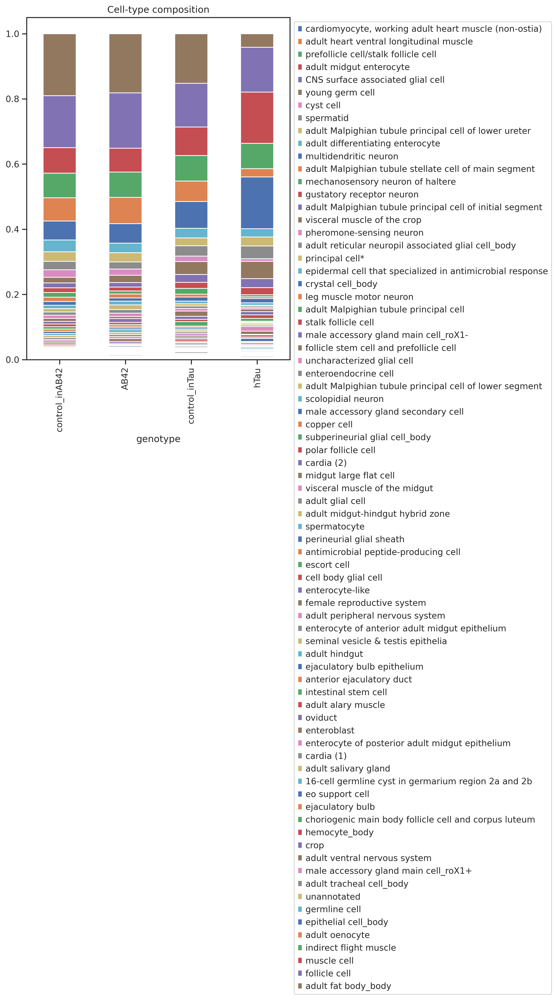

In [46]:
ratioDf=pd.DataFrame(index=annotationGeno_Df.index.to_list(), columns=[genotype + '_ratio' for genotype in annotationGeno_Df.columns[1:]])
for genotype in annotationGeno_Df.columns[1:]:
    print(genotype)
    ratioDf[f'{genotype}_ratio'] = ( annotationGeno_Df[f'{genotype}']/sum(annotationGeno_Df[f'{genotype}']) )
ratioDf = ratioDf.sort_values(by=[ f'{annotationGeno_Df.columns[1]}_ratio' ])
ratioDf

ratioT_Df=ratioDf.transpose()
# ratioT_Df.insert(0, 'genoAge', genoAge_L)
ratioT_Df.insert(0, 'genotype', annotationGeno_Df.columns[1:].to_list())
ratioT_Df

with rc_context({'figure.figsize': (6, 8)}): 
    ax=ratioT_Df.plot(
        x = 'genotype',
        kind = 'bar',
        stacked = True,
        title = 'Cell-type composition'
    )
    ax.grid(axis='x',visible=False)
    # plt.legend(loc='lower right')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.savefig(f'{figure4PicFolder}/{adfcaTissue}_barplot_genotypeGroup_cellRatio.pdf')
    # plt.show()


### Relative ratio (normalize to control, separated by genotype group)
Filter cell types with cellN <700

In [47]:
genoCompare_Df

,expSet,controlSet,age
0,AB42,control_inAB42,"10,20"
1,hTau,control_inTau,"20,30"


In [48]:
genoCompare_D = dict(zip(genoCompare_Df.expSet, genoCompare_Df.controlSet))
genoCompare_D

{'AB42': 'control_inAB42', 'hTau': 'control_inTau'}

In [49]:
ratioDf

,control_inAB42_ratio,AB42_ratio,control_inTau_ratio,hTau_ratio
"cardiomyocyte, working adult heart muscle (non-ostia)",0.000133,0.000144,0.000107,0.000014
adult heart ventral longitudinal muscle,0.000133,0.000156,0.000061,0.000099
prefollicle cell/stalk follicle cell,0.000157,0.000132,0.000199,0.000423
adult midgut enterocyte,0.000193,0.000132,0.000536,0.000353
CNS surface associated glial cell,0.000218,0.000096,0.000199,0.000494
...,...,...,...,...
adult oenocyte,0.071061,0.080547,0.062614,0.025493
indirect flight muscle,0.075390,0.077599,0.078459,0.077523
muscle cell,0.078558,0.073377,0.087506,0.157175
follicle cell,0.159221,0.169598,0.133984,0.137674


In [50]:
normalRatio_Df=ratioDf[:]
normalRatio_Df=normalRatio_Df.drop(['unannotated'], axis=0)
normalRatio_Df=normalRatio_Df[normalRatio_Df.index.isin(celltypeN700_L)]

    
for expSet in genoCompare_Df.expSet:
    controlSet = genoCompare_D[expSet]
    print(expSet, controlSet)
    normalRatio_Df[f'{expSet}/{controlSet}_ratio']=normalRatio_Df[f'{expSet}_ratio']/normalRatio_Df[f'{controlSet}_ratio']

normalRatio_Df=normalRatio_Df.iloc[:,4:]
normalRatioNoLog2_Df=normalRatio_Df[:]
normalRatio_Df=np.log2(normalRatio_Df)

normalRatioNoLog2_Df=normalRatioNoLog2_Df.sort_values(by=f'{genoCompare_Df.iloc[0,0]}/{genoCompare_Df.iloc[0,1]}_ratio', ascending=False)
normalRatio_Df=normalRatio_Df.sort_values(by=f'{genoCompare_Df.iloc[0,0]}/{genoCompare_Df.iloc[0,1]}_ratio', ascending=False)

normalRatio_Df.replace([np.inf, -np.inf], np.nan, inplace=True)
normalRatioNoLog2_Df.replace([np.inf, -np.inf], np.nan, inplace=True)

normalRatio_Df

AB42 control_inAB42
hTau control_inTau


,AB42/control_inAB42_ratio,hTau/control_inTau_ratio
female reproductive system,0.816695,0.803773
adult hindgut,0.541832,-0.256170
adult salivary gland,0.511884,-1.625962
oviduct,0.475937,0.017580
adult ventral nervous system,0.404267,0.427707
adult glial cell,0.239224,0.527517
perineurial glial sheath,0.214701,1.047501
16-cell germline cyst in germarium region 2a and 2b,0.211796,-0.116031
adult peripheral nervous system,0.211456,0.872856
adult oenocyte,0.180774,-1.296372


In [51]:
normalRatio_Df.insert(0, 'annotation', normalRatio_Df.index.to_list())
normalRatio_longDf=normalRatio_Df.melt(id_vars=['annotation'], var_name='genotypeCompare', value_name='log2ratio')
normalRatio_longDf

,annotation,genotypeCompare,log2ratio
0,female reproductive system,AB42/control_inAB42_ratio,0.816695
1,adult hindgut,AB42/control_inAB42_ratio,0.541832
2,adult salivary gland,AB42/control_inAB42_ratio,0.511884
3,oviduct,AB42/control_inAB42_ratio,0.475937
4,adult ventral nervous system,AB42/control_inAB42_ratio,0.404267
...,...,...,...
65,ejaculatory bulb epithelium,hTau/control_inTau_ratio,-1.546839
66,adult alary muscle,hTau/control_inTau_ratio,0.736682
67,intestinal stem cell,hTau/control_inTau_ratio,-0.715701
68,enteroblast,hTau/control_inTau_ratio,-0.947647


In [52]:
annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)]

,TotalCellN,control_inAB42,AB42,control_inTau,hTau
follicle cell,39540,13166,14099.0,8752.0,9764.0
adult fat body_body,36353,15749,15110.0,9945.0,2958.0
muscle cell,26905,6496,6100.0,5716.0,11147.0
epithelial cell_body,24734,4830,4996.0,5393.0,11258.0
indirect flight muscle,20334,6234,6451.0,5125.0,5498.0
adult oenocyte,15605,5876,6696.0,4090.0,1808.0
adult ventral nervous system,9140,1407,1872.0,2589.0,3781.0
adult tracheal cell_body,7900,2152,1800.0,2051.0,2771.0
germline cell,7549,2979,2413.0,1922.0,1811.0
crop,5292,1249,1126.0,1577.0,1941.0


In [53]:
annotationGeno_Df.loc['intestinal stem cell']

TotalCellN        2126.0
control_inAB42     627.0
AB42               448.0
control_inTau      900.0
hTau               595.0
Name: intestinal stem cell, dtype: float64

In [55]:
dfAll=normalRatio_Df[:]
for expSet in genoCompare_Df.expSet:
    controlSet = genoCompare_D[expSet]
    print(expSet, controlSet)
    
    dfAll[f'{expSet}/{controlSet}_CellN'] = annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)][expSet]+annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)][controlSet]

AB42 control_inAB42
hTau control_inTau


/tmp/ipykernel_2216460/561616862.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfAll[f'{expSet}/{controlSet}_CellN'] = annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)][expSet]+annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)][controlSet]
/tmp/ipykernel_2216460/561616862.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfAll[f'{expSet}/{controlSet}_CellN'] = annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)][expSet]+annotationGeno_Df[annotationGeno_Df.index.

In [56]:
dfAll

,annotation,AB42/control_inAB42_ratio,hTau/control_inTau_ratio,AB42/control_inAB42_CellN,hTau/control_inTau_CellN
female reproductive system,female reproductive system,0.816695,0.803773,1100.0,1051.0
adult hindgut,adult hindgut,0.541832,-0.256170,1286.0,504.0
adult salivary gland,adult salivary gland,0.511884,-1.625962,2032.0,611.0
oviduct,oviduct,0.475937,0.017580,1650.0,1314.0
adult ventral nervous system,adult ventral nervous system,0.404267,0.427707,3279.0,6370.0
adult glial cell,adult glial cell,0.239224,0.527517,328.0,572.0
perineurial glial sheath,perineurial glial sheath,0.214701,1.047501,455.0,970.0
16-cell germline cyst in germarium region 2a and 2b,16-cell germline cyst in germarium region 2a a...,0.211796,-0.116031,1844.0,1095.0
adult peripheral nervous system,adult peripheral nervous system,0.211456,0.872856,963.0,1530.0
adult oenocyte,adult oenocyte,0.180774,-1.296372,12572.0,5898.0


In [57]:
dfAll.sort_values(by=['AB42/control_inAB42_ratio'], inplace=True) # ascending=False, 

/tmp/ipykernel_2216460/1320765540.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfAll.sort_values(by=['AB42/control_inAB42_ratio'], inplace=True) # ascending=False,


In [58]:
dotplot_Df=dfAll.melt(id_vars=['annotation'], value_vars=list(dfAll.columns[1:3]), 
                      var_name='genotypeCompare', value_name='log2ratio')
# dotplot_Df

dotplot_Df=pd.concat([dotplot_Df, 
           dfAll.melt(id_vars=['annotation'], value_vars=list(dfAll.columns[3:]), 
                      var_name='genotypeCompare', value_name='cellN').iloc[:,2] ], 
          axis=1) # 

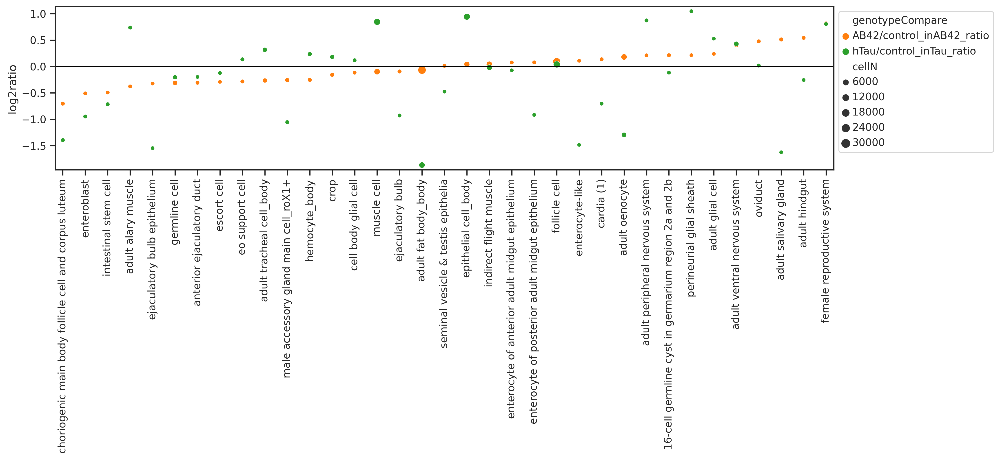

In [61]:
with rc_context({'figure.figsize': (15, 7)}):
    ax=sns.scatterplot(data=dotplot_Df, 
                       x="annotation", y="log2ratio", hue="genotypeCompare", size='cellN', palette=sns.color_palette("tab10")[1:3]) # palette=set2Color_L # palette='Set2', 
    ax.grid(axis='x',visible=False)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.axhline(0, color='black', linewidth=0.5)
    # plt.tight_layout(w_pad=0.5)
    plt.subplots_adjust(bottom=0.6)
    plt.tight_layout()
    ax.margins(0.01, 0.03)
    # plt.ylim(-1, 4.5)
    plt.savefig(f'{figure4PicFolder}/{adfcaTissue}_dotplot_cellRatio_normalizeToControl_genotypeCom.pdf')
    plt.show()


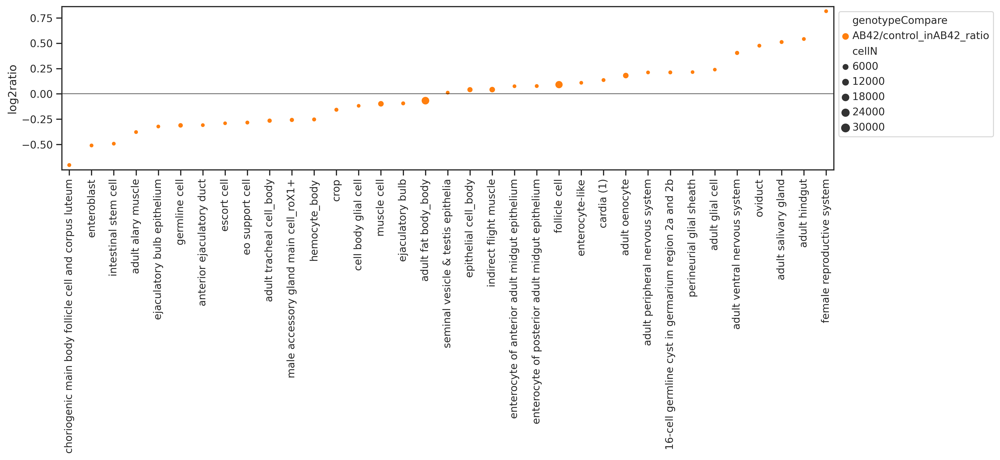

In [62]:
### No Tau
with rc_context({'figure.figsize': (15, 7)}):
    ax=sns.scatterplot(data=dotplot_Df[ (dotplot_Df.genotypeCompare != 'hTau/control_inTau_ratio') ], 
                       x="annotation", y="log2ratio", size='cellN', hue="genotypeCompare", palette=sns.color_palette("tab10")[1:2]) # palette=set2Color_L # palette='Set2',  # hue="genotypeCompare", # palette=sns.color_palette("tab10")[1:2]
    ax.grid(axis='x',visible=False)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.axhline(0, color='black', linewidth=0.5)
    # plt.tight_layout(w_pad=0.5)
    plt.subplots_adjust(bottom=0.6)
    plt.tight_layout()
    ax.margins(0.01, 0.03)
    # plt.ylim(-1, 1)
    # plt.yticks([-1, 0, 1])
    plt.savefig(f'{figure4PicFolder}/{adfcaTissue}_dotplot_cellRatio_normalizeToControl_genotypeCom_noTau.pdf')
    plt.show()

Sort data by hTau/control ratio

In [63]:
dfAll.sort_values(by=['hTau/control_inTau_ratio'], inplace=True) # ascending=False, 

/tmp/ipykernel_2216460/878428539.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfAll.sort_values(by=['hTau/control_inTau_ratio'], inplace=True) # ascending=False,


In [64]:
dotplot_Df=dfAll.melt(id_vars=['annotation'], value_vars=list(dfAll.columns[1:3]), 
                      var_name='genotypeCompare', value_name='log2ratio')
# dotplot_Df

dotplot_Df=pd.concat([dotplot_Df, 
           dfAll.melt(id_vars=['annotation'], value_vars=list(dfAll.columns[3:]), 
                      var_name='genotypeCompare', value_name='cellN').iloc[:,2] ], 
          axis=1) # 

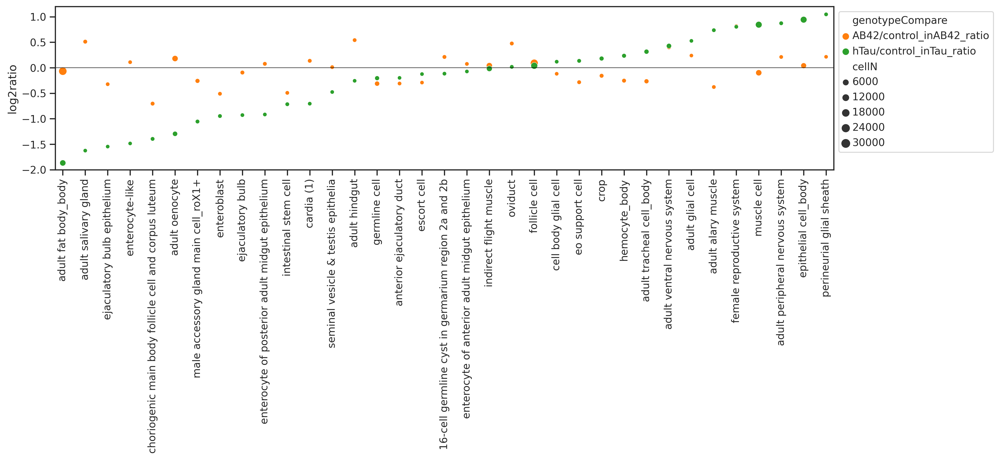

In [66]:
### Sorted by hTau

with rc_context({'figure.figsize': (15, 7)}):
    ax=sns.scatterplot(data=dotplot_Df, 
                       x="annotation", y="log2ratio", hue="genotypeCompare", size='cellN', palette=sns.color_palette("tab10")[1:3]) # palette=set2Color_L # palette='Set2', 
    ax.grid(axis='x',visible=False)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.axhline(0, color='black', linewidth=0.5)
    # plt.tight_layout(w_pad=0.5)
    plt.subplots_adjust(bottom=0.6)
    plt.tight_layout()
    ax.margins(0.01, 0.03)
    plt.ylim(-2, 1.2)
    # plt.yticks([-1, 0, 1])
    plt.savefig(f'{figure4PicFolder}/{adfcaTissue}_dotplot_cellRatio_normalizeToControl_genotypeCom_sortedByTau.pdf')
    plt.show()


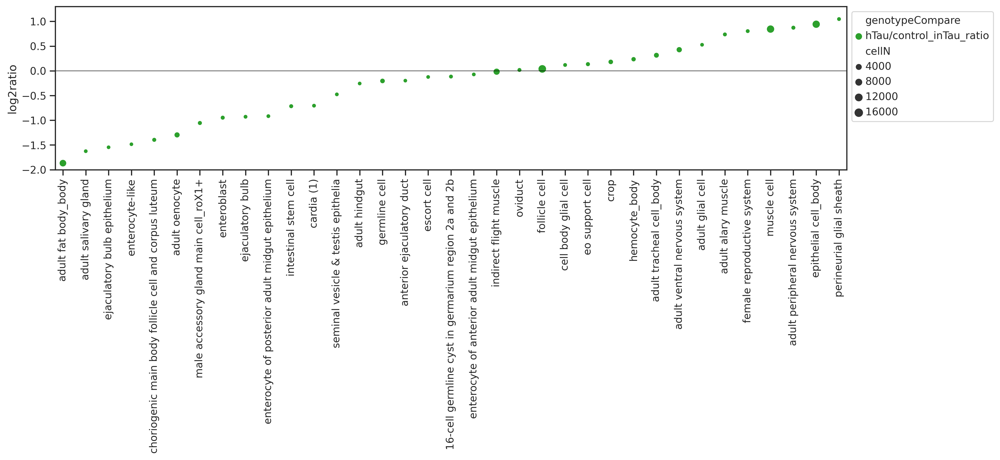

In [67]:
### No AB42

with rc_context({'figure.figsize': (15, 7)}):
    ax=sns.scatterplot(data=dotplot_Df[(dotplot_Df.genotypeCompare == 'hTau/control_inTau_ratio')], 
                       x="annotation", y="log2ratio", hue="genotypeCompare", size='cellN', palette=sns.color_palette("tab10")[2:3]) # palette=set2Color_L # palette='Set2', 
    ax.grid(axis='x',visible=False)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.axhline(0, color='black', linewidth=0.5)
    # plt.tight_layout(w_pad=0.5)
    plt.subplots_adjust(bottom=0.6)
    plt.tight_layout()
    ax.margins(0.01, 0.03)
    plt.ylim(-2, 1.3)
    # plt.yticks([-1, 0, 1])
    plt.savefig(f'{figure4PicFolder}/{adfcaTissue}_dotplot_cellRatio_normalizeToControl_genotypeCom_noABcluster_noAB42.pdf')
    plt.show()

### Output cell# and ratios

In [68]:
annotationDf.to_csv(f'{cellnFolder}/{adfcaTissue}_cellN_genotypeGroup.csv')

In [69]:
dfAll.to_csv(f'{cellnFolder}/{adfcaTissue}_dfAll_genotypeGroup.csv')
ratioDf.to_csv(f'{cellnFolder}/{adfcaTissue}_ratioDf_genotypeGroup.csv')
dotplot_Df.to_csv(f'{cellnFolder}/{adfcaTissue}_ratioDf_dotplot_Df_genotypeGroup.csv')

In [70]:
normalRatio_Df.to_csv(f'{cellnFolder}/{adfcaTissue}_normalRatioDf_normalizeToControl_genotypeGroup.csv')
normalRatioNoLog2_Df.to_csv(f'{cellnFolder}/{adfcaTissue}_normalRatioNoLog2_Df_normalizeToControl_genotypeGroup.csv')
normalRatio_longDf.to_csv(f'{cellnFolder}/{adfcaTissue}_normalRatio_longDf_normalizeToControl_genotypeGroup.csv')

### Add adfca_annotation_broad

In [24]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [25]:
dfAll = pd.read_csv(f'{cellnFolder}/{adfcaTissue}_dfAll_genotypeGroup.csv', index_col=0)
dotplot_Df = pd.read_csv(f'{cellnFolder}/{adfcaTissue}_ratioDf_dotplot_Df_genotypeGroup.csv')

In [26]:
annotation_Df = pd.read_csv(f'/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_annotation_detailed_and_broad_detailed_subcluster.csv')
annotation_Df

,adfca_annotation_broad,adfca_annotation_group,adfca_annotation,adfca_annotation_subcluster,cellN
0,CNS neuron,ABeta42-specific cluster,ABeta42-specific cluster,ABeta42-specific cluster,3765
1,CNS neuron,CNS neuron ungrouped,neuron 1,neuron 1,1118
2,CNS neuron,CNS neuron ungrouped,neuron 10,neuron 10,589
3,CNS neuron,CNS neuron ungrouped,neuron 11,neuron 11,624
4,CNS neuron,CNS neuron ungrouped,neuron 12,neuron 12,417
...,...,...,...,...,...
215,sensory neuron,sensory neuron,scolopidial neuron,scolopidial neuron,659
216,tracheal cell,tracheal cell,adult tracheal cell_body,adult tracheal cell_body,7900
217,tracheal cell,tracheal cell,adult tracheal cell_head,adult tracheal cell_head,6560
218,unannotated,unannotated,antimicrobial peptide-producing cell,antimicrobial peptide-producing cell,507


In [ ]:
# broad_L = ['CNS neuron', 'sensory neuron', 'glial cell', 'PNS neuron']

In [27]:
annot2broad_D = dict(zip(annotation_Df.adfca_annotation, annotation_Df.adfca_annotation_broad))
annot2group_D = dict(zip(annotation_Df.adfca_annotation, annotation_Df.adfca_annotation_group))

In [28]:
ratioDf = pd.read_csv(f'{cellnFolder}/{adfcaTissue}_ratioDf_genotypeGroup.csv', index_col=0)
ratioDf['adfca_annotation'] = list(ratioDf.index)
ratioDf

,control_inAB42_ratio,AB42_ratio,control_inTau_ratio,hTau_ratio,adfca_annotation
"cardiomyocyte, working adult heart muscle (non-ostia)",0.000133,0.000144,0.000107,0.000014,"cardiomyocyte, working adult heart muscle (non..."
adult heart ventral longitudinal muscle,0.000133,0.000156,0.000061,0.000099,adult heart ventral longitudinal muscle
prefollicle cell/stalk follicle cell,0.000157,0.000132,0.000199,0.000423,prefollicle cell/stalk follicle cell
adult midgut enterocyte,0.000193,0.000132,0.000536,0.000353,adult midgut enterocyte
CNS surface associated glial cell,0.000218,0.000096,0.000199,0.000494,CNS surface associated glial cell
...,...,...,...,...,...
adult oenocyte,0.071061,0.080547,0.062614,0.025493,adult oenocyte
indirect flight muscle,0.075390,0.077599,0.078459,0.077523,indirect flight muscle
muscle cell,0.078558,0.073377,0.087506,0.157175,muscle cell
follicle cell,0.159221,0.169598,0.133984,0.137674,follicle cell


In [29]:
ratioDf['adfca_annotation_broad'] = pd.Categorical([annot2broad_D[annot] for annot in ratioDf.index if annot ])
ratioDf

,control_inAB42_ratio,AB42_ratio,control_inTau_ratio,hTau_ratio,adfca_annotation,adfca_annotation_broad
"cardiomyocyte, working adult heart muscle (non-ostia)",0.000133,0.000144,0.000107,0.000014,"cardiomyocyte, working adult heart muscle (non...",cardial cell
adult heart ventral longitudinal muscle,0.000133,0.000156,0.000061,0.000099,adult heart ventral longitudinal muscle,muscle cell
prefollicle cell/stalk follicle cell,0.000157,0.000132,0.000199,0.000423,prefollicle cell/stalk follicle cell,female reproductive system
adult midgut enterocyte,0.000193,0.000132,0.000536,0.000353,adult midgut enterocyte,gut cell
CNS surface associated glial cell,0.000218,0.000096,0.000199,0.000494,CNS surface associated glial cell,glial cell
...,...,...,...,...,...,...
adult oenocyte,0.071061,0.080547,0.062614,0.025493,adult oenocyte,oenocyte
indirect flight muscle,0.075390,0.077599,0.078459,0.077523,indirect flight muscle,muscle cell
muscle cell,0.078558,0.073377,0.087506,0.157175,muscle cell,muscle cell
follicle cell,0.159221,0.169598,0.133984,0.137674,follicle cell,female reproductive system


In [30]:
dotplot_Df['adfca_annotation_broad'] = pd.Categorical([ annot2broad_D[annot] for annot in dotplot_Df.annotation ])
dotplot_Df

,Unnamed: 0,annotation,genotypeCompare,log2ratio,cellN,adfca_annotation_broad
0,0,adult fat body_body,AB42/control_inAB42_ratio,-0.067448,30859.0,fat cell
1,1,adult salivary gland,AB42/control_inAB42_ratio,0.511884,2032.0,gland
2,2,ejaculatory bulb epithelium,AB42/control_inAB42_ratio,-0.322893,965.0,male reproductive system
3,3,enterocyte-like,AB42/control_inAB42_ratio,0.109205,815.0,gut cell
4,4,choriogenic main body follicle cell and corpus...,AB42/control_inAB42_ratio,-0.704048,1926.0,female reproductive system
...,...,...,...,...,...,...
65,65,female reproductive system,hTau/control_inTau_ratio,0.803773,1051.0,female reproductive system
66,66,muscle cell,hTau/control_inTau_ratio,0.844912,16863.0,muscle cell
67,67,adult peripheral nervous system,hTau/control_inTau_ratio,0.872856,1530.0,PNS neuron
68,68,epithelial cell_body,hTau/control_inTau_ratio,0.943125,16651.0,epithelial cell


In [31]:
len(dotplot_Df['adfca_annotation_broad'].value_counts())

14

In [32]:
# cmap=sns.color_palette("Set3", 8) # Pastel2
cmap=sns.color_palette("Set3", 9) # Pastel2
cmap

[(0.5529411764705883, 0.8274509803921568, 0.7803921568627451),
 (1.0, 1.0, 0.7019607843137254),
 (0.7450980392156863, 0.7294117647058823, 0.8549019607843137),
 (0.984313725490196, 0.5019607843137255, 0.4470588235294118),
 (0.5019607843137255, 0.6941176470588235, 0.8274509803921568),
 (0.9921568627450981, 0.7058823529411765, 0.3843137254901961),
 (0.7019607843137254, 0.8705882352941177, 0.4117647058823529),
 (0.9882352941176471, 0.803921568627451, 0.8980392156862745),
 (0.8509803921568627, 0.8509803921568627, 0.8509803921568627)]

In [33]:
# value_to_int={'body':0, 'head': 1}
value_to_int = dict(zip(dotplot_Df.adfca_annotation_broad.value_counts().index.to_list(), range(len(dotplot_Df.adfca_annotation_broad.value_counts()))))
# value_to_int.pop('unannotated')
# value_to_int
n = len(value_to_int) 

In [34]:
print(n)
value_to_int

14


{'gut cell': 0,
 'female reproductive system': 1,
 'gland': 2,
 'glial cell': 3,
 'male reproductive system': 4,
 'muscle cell': 5,
 'epithelial cell': 6,
 'female germline cell': 7,
 'CNS neuron': 8,
 'PNS neuron': 9,
 'fat cell': 10,
 'hemocyte': 11,
 'oenocyte': 12,
 'tracheal cell': 13}

In [35]:
dotplot_Df_Abeta = dotplot_Df[  (dotplot_Df.genotypeCompare == 'AB42/control_inAB42_ratio') ] # (dotplot_Df.annotation != 'ABeta42-specific cluster') &
dotplot_Df_Abeta.sort_values(by='log2ratio', inplace=True)
dotplot_Df_Abeta

/tmp/ipykernel_2227255/695577831.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dotplot_Df_Abeta.sort_values(by='log2ratio', inplace=True)


,Unnamed: 0,annotation,genotypeCompare,log2ratio,cellN,adfca_annotation_broad
4,4,choriogenic main body follicle cell and corpus...,AB42/control_inAB42_ratio,-0.704048,1926.0,female reproductive system
7,7,enteroblast,AB42/control_inAB42_ratio,-0.510350,1293.0,gut cell
10,10,intestinal stem cell,AB42/control_inAB42_ratio,-0.492658,1075.0,gut cell
29,29,adult alary muscle,AB42/control_inAB42_ratio,-0.378060,1128.0,muscle cell
2,2,ejaculatory bulb epithelium,AB42/control_inAB42_ratio,-0.322893,965.0,male reproductive system
14,14,germline cell,AB42/control_inAB42_ratio,-0.311691,5392.0,female germline cell
15,15,anterior ejaculatory duct,AB42/control_inAB42_ratio,-0.309406,1027.0,male reproductive system
16,16,escort cell,AB42/control_inAB42_ratio,-0.290998,470.0,female reproductive system
23,23,eo support cell,AB42/control_inAB42_ratio,-0.283887,1729.0,epithelial cell
26,26,adult tracheal cell_body,AB42/control_inAB42_ratio,-0.265372,3952.0,tracheal cell


In [36]:
df=pd.DataFrame(index=dotplot_Df_Abeta.annotation.to_list()).T
df.loc['value',:] = [value_to_int[annot] for annot in dotplot_Df_Abeta.adfca_annotation_broad]
df

,choriogenic main body follicle cell and corpus luteum,enteroblast,intestinal stem cell,adult alary muscle,ejaculatory bulb epithelium,germline cell,anterior ejaculatory duct,escort cell,eo support cell,adult tracheal cell_body,...,adult oenocyte,adult peripheral nervous system,16-cell germline cyst in germarium region 2a and 2b,perineurial glial sheath,adult glial cell,adult ventral nervous system,oviduct,adult salivary gland,adult hindgut,female reproductive system
value,1.0,0.0,0.0,5.0,4.0,7.0,4.0,1.0,6.0,13.0,...,12.0,9.0,7.0,3.0,3.0,8.0,1.0,2.0,0.0,1.0


In [37]:
value_to_int.keys()

dict_keys(['gut cell', 'female reproductive system', 'gland', 'glial cell', 'male reproductive system', 'muscle cell', 'epithelial cell', 'female germline cell', 'CNS neuron', 'PNS neuron', 'fat cell', 'hemocyte', 'oenocyte', 'tracheal cell'])

In [38]:
broadColor1_Df = pd.read_csv(f'{figure1Folder}/broadColor1_Df.csv', index_col=0)
broadColor1_D = dict(zip(broadColor1_Df.index, broadColor1_Df.colorKey))
broadColor1_D

{'CNS neuron': '#9edae5',
 'PNS neuron': '#d62728',
 'cardial cell': '#17becf',
 'epithelial cell': '#dbdb8d',
 'excretory system': '#ff9896',
 'fat cell': '#8c564b',
 'female germline cell': '#7f7f7f',
 'female reproductive system': '#98df8a',
 'gland': '#c49c94',
 'glial cell': '#e377c2',
 'gut cell': '#ff7f0e',
 'hemocyte': '#ffbb78',
 'male germline cell': '#2ca02c',
 'male reproductive system': '#1f77b4',
 'muscle cell': '#c7c7c7',
 'oenocyte': '#c5b0d5',
 'sensory neuron': '#f7b6d2',
 'tracheal cell': '#9467bd',
 'unannotated': '#bcbd22'}

In [40]:
cmap_L = [broadColor1_D[celltype] if celltype in broadColor1_D.keys() else cmap[-1] for celltype in dotplot_Df.adfca_annotation_broad.value_counts().index.to_list()]

/tmp/ipykernel_2227255/2269818424.py:8: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


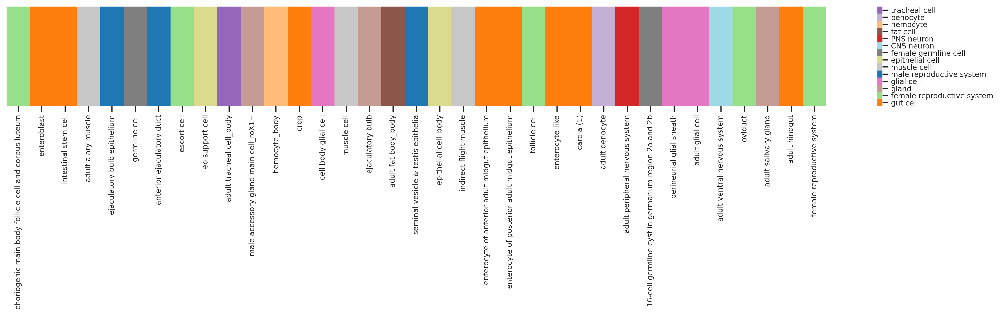

In [45]:
fig, ax = plt.subplots(figsize=(20, 2))
parameters = {'xtick.labelsize': 8,'ytick.labelsize': 8, 'legend.fontsize':8}
plt.rcParams.update(parameters)

# ax=sns.heatmap(df, cmap='Set3', xticklabels=True)
# ax=sns.heatmap(df, cmap= cmap[:1]+cmap[2:], xticklabels=True, yticklabels=False) # cmap[:8]
ax=sns.heatmap(df, cmap= cmap_L, xticklabels=True, yticklabels=False) # cmap[:8]
plt.tight_layout()

colorbar=ax.collections[0].colorbar
r = colorbar.vmax - colorbar.vmin
colorbar.set_ticks([colorbar.vmin + r / n * (0.5 + i) for i in range(n)])
colorbar.set_ticklabels(value_to_int.keys()) #not in the right order # sorted(list(value_to_int.keys()))

plt.savefig(f'{figure4PicFolder}/{adfcaTissue}_barplot_cellRatio_normalizeToControl_genotypeCom_sortedByABeta_broadCellType.pdf', bbox_inches='tight')
plt.show()

**Sorted by hTau**

In [46]:
dotplot_Df_tau = dotplot_Df[ (dotplot_Df.genotypeCompare != 'AB42/control_inAB42_ratio') ]
dotplot_Df_tau.sort_values(by='log2ratio', inplace=True)
dotplot_Df_tau

/tmp/ipykernel_2227255/1276648589.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dotplot_Df_tau.sort_values(by='log2ratio', inplace=True)


,Unnamed: 0,annotation,genotypeCompare,log2ratio,cellN,adfca_annotation_broad
35,35,adult fat body_body,hTau/control_inTau_ratio,-1.868015,12903.0,fat cell
36,36,adult salivary gland,hTau/control_inTau_ratio,-1.625962,611.0,gland
37,37,ejaculatory bulb epithelium,hTau/control_inTau_ratio,-1.546839,454.0,male reproductive system
38,38,enterocyte-like,hTau/control_inTau_ratio,-1.485448,340.0,gut cell
39,39,choriogenic main body follicle cell and corpus...,hTau/control_inTau_ratio,-1.396086,1623.0,female reproductive system
40,40,adult oenocyte,hTau/control_inTau_ratio,-1.296372,5898.0,oenocyte
41,41,male accessory gland main cell_roX1+,hTau/control_inTau_ratio,-1.055324,1696.0,gland
42,42,enteroblast,hTau/control_inTau_ratio,-0.947647,1602.0,gut cell
43,43,ejaculatory bulb,hTau/control_inTau_ratio,-0.929076,928.0,gland
44,44,enterocyte of posterior adult midgut epithelium,hTau/control_inTau_ratio,-0.917151,830.0,gut cell


In [47]:
df=pd.DataFrame(index=dotplot_Df_tau.annotation.to_list()).T
df.loc['value',:] = [value_to_int[annot] for annot in dotplot_Df_tau.adfca_annotation_broad]
df

,adult fat body_body,adult salivary gland,ejaculatory bulb epithelium,enterocyte-like,choriogenic main body follicle cell and corpus luteum,adult oenocyte,male accessory gland main cell_roX1+,enteroblast,ejaculatory bulb,enterocyte of posterior adult midgut epithelium,...,hemocyte_body,adult tracheal cell_body,adult ventral nervous system,adult glial cell,adult alary muscle,female reproductive system,muscle cell,adult peripheral nervous system,epithelial cell_body,perineurial glial sheath
value,10.0,2.0,4.0,0.0,1.0,12.0,2.0,0.0,2.0,0.0,...,11.0,13.0,8.0,3.0,5.0,1.0,5.0,9.0,6.0,3.0


In [48]:
cmap_L = [broadColor1_D[celltype] if celltype in broadColor1_D.keys() else cmap[-1] for celltype in dotplot_Df_tau.adfca_annotation_broad.value_counts().index.to_list()]

/tmp/ipykernel_2227255/3901664922.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<Figure size 3000x225 with 0 Axes>

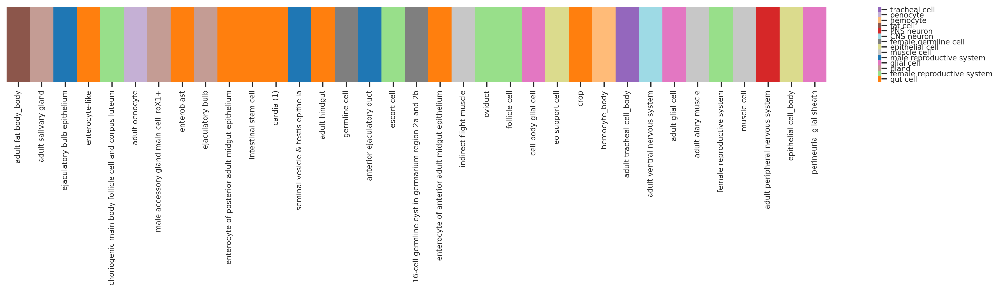

In [49]:
plt.figure(figsize=(20, 1.5))
fig, ax = plt.subplots(figsize=(20, 1.5))
parameters = {'xtick.labelsize': 8,'ytick.labelsize': 8, 'legend.fontsize':8}
plt.rcParams.update(parameters)

ax=sns.heatmap(df, cmap= cmap_L, xticklabels=True, yticklabels=False) # cmap[:8]
plt.tight_layout()

colorbar=ax.collections[0].colorbar
r = colorbar.vmax - colorbar.vmin 
colorbar.set_ticks([colorbar.vmin + r / n * (0.5 + i) for i in range(n)])
colorbar.set_ticklabels(value_to_int.keys()) #not in the right order # sorted(list(value_to_int.keys()))

plt.savefig(f'{figure4PicFolder}/{adfcaTissue}_barplot_cellRatio_normalizeToControl_genotypeCom_sortedByTau_broadCellType.pdf', bbox_inches='tight')
plt.show()

# DEG#

## Load data

In [24]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [22]:
adata_headBody = adata_head.concatenate(adata_body, join='outer')
adata_headBody

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


AnnData object with n_obs × n_vars = 624458 × 3285
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_5.0', 'leiden_6.0', 'leiden_7.0', 'leiden_8.0', 'leiden_9.0', 'leiden_10.0', 'adfca_annotation_group', 'adfca_annotation_group2'
    var: 'gene_ids-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'mean-0', 'std-0', 'gene_ids-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'mean-1', 'std-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'

### DEG# processed in Fig 3

In [51]:
degLong_Df=pd.read_csv(f'{figure3Folder}/degSummary/degLong_Df_genotype_compareToControl_cellN700.csv', index_col=0)
degN_mtx = pd.read_csv(f'{figure3Folder}/degSummary/degN_mtx_genotype_compareToControl_cellN700.csv', index_col=0)

In [52]:
degN_mtx_body = degN_mtx[degN_mtx.index.isin(adata_body.obs.adfca_annotation.cat.categories)]
degN_mtx_body

,AB42_control_inAB42,hTau_control_inTau
adult fat body_body,2417,2409
follicle cell,2275,2188
enterocyte of posterior adult midgut epithelium,393,1730
male accessory gland main cell_roX1+,854,1224
adult oenocyte,1114,1123
enterocyte of anterior adult midgut epithelium,177,949
germline cell,673,765
adult hindgut,289,665
crop,86,540
epithelial cell_body,118,533


## DEG: compare to control

### Plot DEG#

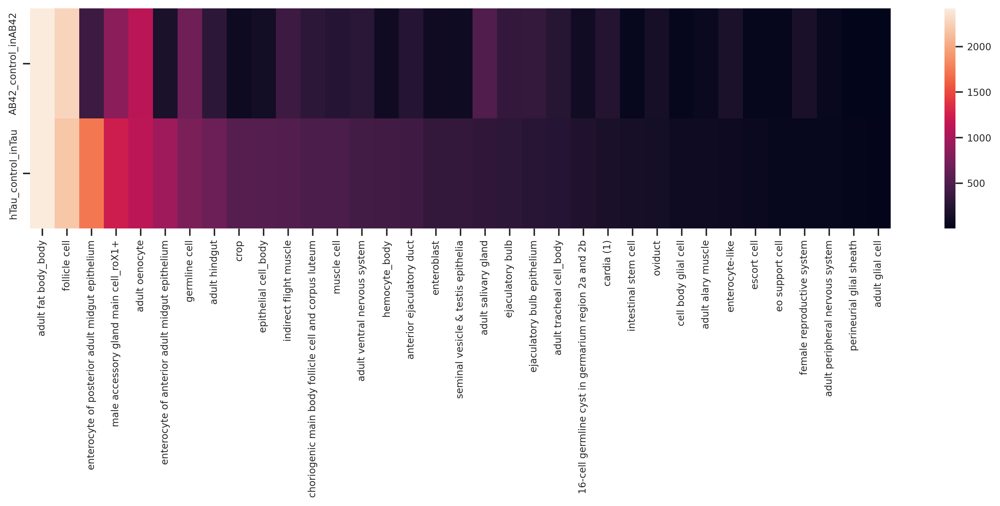

In [58]:
with rc_context({'figure.figsize': (13, 6)}): 
    sns.heatmap(degN_mtx_body.transpose(), xticklabels=True) #, figsize=(12,20)
    plt.ylabel('')
    plt.tight_layout()
    plt.savefig(f'{figure4PicFolder}/degN_mtx_body_normalizeToControl_heatmap.pdf')
    plt.show()

/tmp/ipykernel_2227255/1241585438.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  degN_mtx_body.sort_values(degN_mtx_body.columns[1], ascending=False, inplace=True)


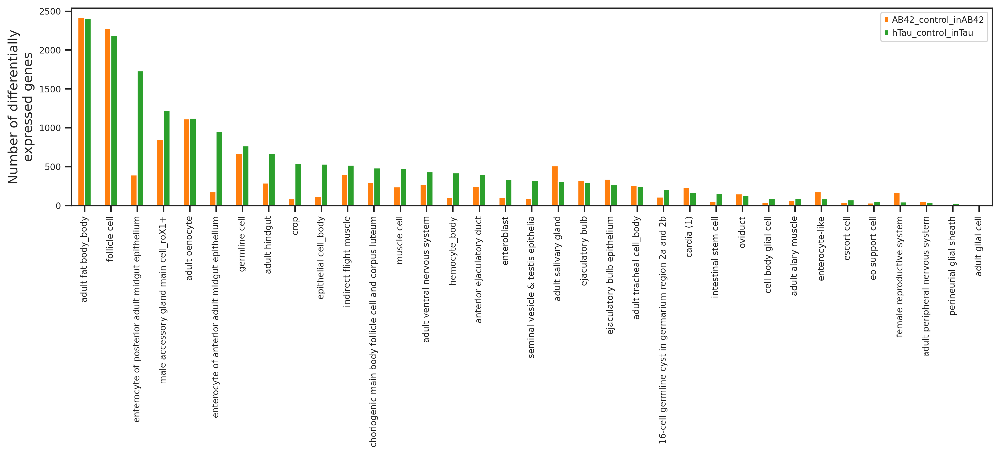

In [60]:
degN_mtx_body.sort_values(degN_mtx_body.columns[1], ascending=False, inplace=True)
# with rc_context({'figure.figsize': (16, 9)}): 
ax=degN_mtx_body.plot(kind='bar', figsize=(13, 6), color=sns.color_palette("tab10")[1:3] + sns.color_palette("tab20")[4:6])  #sns.color_palette("Paired")[:4]  # color=["#66C2A5", "#E9936A", "#A89BB0"] # colormap='Set3'
ax.grid(axis='x',visible=False)

plt.ylabel("Number of differentially\nexpressed genes")
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.xticks(rotation=90)
# plt.tight_layout(w_pad=0.5)
plt.subplots_adjust(bottom=0.5)
# plt.axis('off')
# plt.yscale("log")


plt.tight_layout()
plt.savefig(f'{figure4PicFolder}/degN_body_genotype_barplot.pdf') # bbox_inches='tight'
# plt.show()

/tmp/ipykernel_2227255/2201295318.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  degN_mtx_body.sort_values(degN_mtx_body.columns[0], ascending=False, inplace=True)


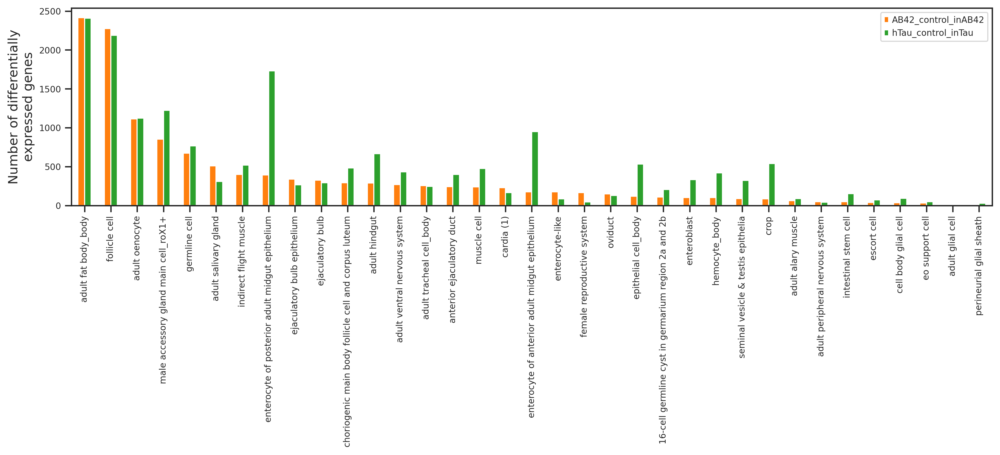

In [61]:
degN_mtx_body.sort_values(degN_mtx_body.columns[0], ascending=False, inplace=True)
# with rc_context({'figure.figsize': (16, 9)}): 
ax=degN_mtx_body.plot(kind='bar', figsize=(13, 6), color=sns.color_palette("tab10")[1:3] + sns.color_palette("tab20")[4:6])  #sns.color_palette("Paired")[:4]  # color=["#66C2A5", "#E9936A", "#A89BB0"] # colormap='Set3'
ax.grid(axis='x',visible=False)

plt.ylabel("Number of differentially\nexpressed genes")
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.xticks(rotation=90)
# plt.tight_layout(w_pad=0.5)
plt.subplots_adjust(bottom=0.5)
# plt.axis('off')
# plt.yscale("log")


plt.tight_layout()
plt.savefig(f'{figure4PicFolder}/degN_body_genotype_barplot_sortedByAbeta.pdf') # bbox_inches='tight'
# plt.show()

### Output file

In [62]:
degN_mtx_body.to_csv(f'{degSummaryFolder}/degN_mtx_body_compareToControll_cellN700.csv')

### Add adfca_annotation_broad

In [63]:
annotation_Df = pd.read_csv(f'/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_annotation_detailed_and_broad_detailed_subcluster.csv')
annotation_Df

,adfca_annotation_broad,adfca_annotation_group,adfca_annotation,adfca_annotation_subcluster,cellN
0,CNS neuron,ABeta42-specific cluster,ABeta42-specific cluster,ABeta42-specific cluster,3765
1,CNS neuron,CNS neuron ungrouped,neuron 1,neuron 1,1118
2,CNS neuron,CNS neuron ungrouped,neuron 10,neuron 10,589
3,CNS neuron,CNS neuron ungrouped,neuron 11,neuron 11,624
4,CNS neuron,CNS neuron ungrouped,neuron 12,neuron 12,417
...,...,...,...,...,...
215,sensory neuron,sensory neuron,scolopidial neuron,scolopidial neuron,659
216,tracheal cell,tracheal cell,adult tracheal cell_body,adult tracheal cell_body,7900
217,tracheal cell,tracheal cell,adult tracheal cell_head,adult tracheal cell_head,6560
218,unannotated,unannotated,antimicrobial peptide-producing cell,antimicrobial peptide-producing cell,507


In [64]:
annot2broad_D = dict(zip(annotation_Df.adfca_annotation, annotation_Df.adfca_annotation_broad))
annot2group_D = dict(zip(annotation_Df.adfca_annotation, annotation_Df.adfca_annotation_group))

In [65]:
broadColor1_Df = pd.read_csv(f'{figure1Folder}/broadColor1_Df.csv', index_col=0)
broadColor1_D = dict(zip(broadColor1_Df.index, broadColor1_Df.colorKey))
broadColor1_D

{'CNS neuron': '#9edae5',
 'PNS neuron': '#d62728',
 'cardial cell': '#17becf',
 'epithelial cell': '#dbdb8d',
 'excretory system': '#ff9896',
 'fat cell': '#8c564b',
 'female germline cell': '#7f7f7f',
 'female reproductive system': '#98df8a',
 'gland': '#c49c94',
 'glial cell': '#e377c2',
 'gut cell': '#ff7f0e',
 'hemocyte': '#ffbb78',
 'male germline cell': '#2ca02c',
 'male reproductive system': '#1f77b4',
 'muscle cell': '#c7c7c7',
 'oenocyte': '#c5b0d5',
 'sensory neuron': '#f7b6d2',
 'tracheal cell': '#9467bd',
 'unannotated': '#bcbd22'}

In [66]:
degN_mtx_body

,AB42_control_inAB42,hTau_control_inTau
adult fat body_body,2417,2409
follicle cell,2275,2188
adult oenocyte,1114,1123
male accessory gland main cell_roX1+,854,1224
germline cell,673,765
adult salivary gland,509,308
indirect flight muscle,398,519
enterocyte of posterior adult midgut epithelium,393,1730
ejaculatory bulb epithelium,339,265
ejaculatory bulb,326,293


In [67]:
degN_mtx_body['adfca_annotation_broad'] = pd.Categorical([annot2broad_D[index] for index in degN_mtx_body.index])
degN_mtx_body.sort_values(degN_mtx_body.columns[0], ascending=False, inplace=True)
degN_mtx_body

/tmp/ipykernel_2227255/1184561918.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  degN_mtx_body['adfca_annotation_broad'] = pd.Categorical([annot2broad_D[index] for index in degN_mtx_body.index])
/tmp/ipykernel_2227255/1184561918.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  degN_mtx_body.sort_values(degN_mtx_body.columns[0], ascending=False, inplace=True)


,AB42_control_inAB42,hTau_control_inTau,adfca_annotation_broad
adult fat body_body,2417,2409,fat cell
follicle cell,2275,2188,female reproductive system
adult oenocyte,1114,1123,oenocyte
male accessory gland main cell_roX1+,854,1224,gland
germline cell,673,765,female germline cell
adult salivary gland,509,308,gland
indirect flight muscle,398,519,muscle cell
enterocyte of posterior adult midgut epithelium,393,1730,gut cell
ejaculatory bulb epithelium,339,265,male reproductive system
ejaculatory bulb,326,293,gland


In [68]:
# value_to_int={'body':0, 'head': 1}
value_to_int = dict(zip(degN_mtx_body.adfca_annotation_broad.value_counts().index.to_list(), range(len( degN_mtx_body.adfca_annotation_broad.value_counts().index.to_list() )) ))
n = len(value_to_int) 
print('n: ', n)

n:  14


In [69]:
value_to_int

{'gut cell': 0,
 'female reproductive system': 1,
 'gland': 2,
 'glial cell': 3,
 'male reproductive system': 4,
 'muscle cell': 5,
 'epithelial cell': 6,
 'female germline cell': 7,
 'CNS neuron': 8,
 'PNS neuron': 9,
 'fat cell': 10,
 'hemocyte': 11,
 'oenocyte': 12,
 'tracheal cell': 13}

In [78]:
### sorted by ABeta42
degN_mtx_body.sort_values(degN_mtx_body.columns[0], ascending=False, inplace=True)
df=pd.DataFrame(index=degN_mtx_body.index.to_list()).T
df.loc['value',:] = [value_to_int[annot] for annot in degN_mtx_body.adfca_annotation_broad]
df

/tmp/ipykernel_2227255/1100184088.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  degN_mtx_body.sort_values(degN_mtx_body.columns[0], ascending=False, inplace=True)


,adult fat body_body,follicle cell,adult oenocyte,male accessory gland main cell_roX1+,germline cell,adult salivary gland,indirect flight muscle,enterocyte of posterior adult midgut epithelium,ejaculatory bulb epithelium,ejaculatory bulb,...,seminal vesicle & testis epithelia,crop,adult alary muscle,adult peripheral nervous system,intestinal stem cell,escort cell,cell body glial cell,eo support cell,adult glial cell,perineurial glial sheath
value,10.0,1.0,12.0,2.0,7.0,2.0,5.0,0.0,4.0,2.0,...,4.0,0.0,5.0,9.0,0.0,1.0,3.0,6.0,3.0,3.0


In [79]:
# cmap_L = [broadColor1_D[celltype] if celltype in broadColor1_D.keys() else cmap[-1] for celltype in dotplot_Df.adfca_annotation_broad.value_counts().index.to_list()]
cmap_L = [broadColor1_D[celltype] if celltype in broadColor1_D.keys() else cmap[-1] for celltype in value_to_int.keys()]
# cmap_L

/tmp/ipykernel_2227255/1047270631.py:9: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


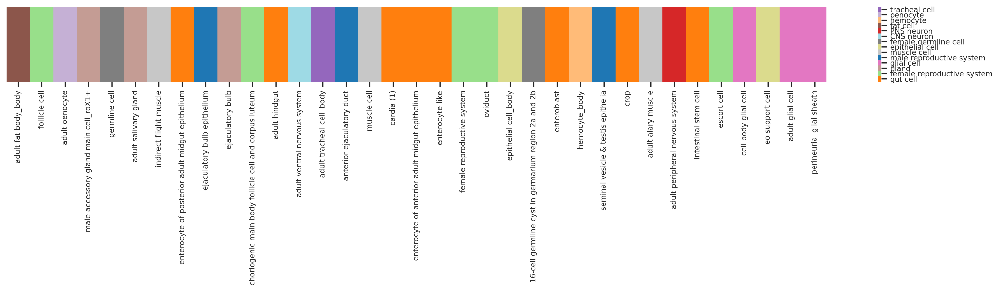

In [80]:
# plt.figure(figsize=(20, 1.5))
fig, ax = plt.subplots(figsize=(20, 1.5))
parameters = {'xtick.labelsize': 8,'ytick.labelsize': 8, 'legend.fontsize':8}
plt.rcParams.update(parameters)

# ax=sns.heatmap(df, cmap='Set3', xticklabels=True)
# ax=sns.heatmap(df, cmap= cmap[:1]+cmap[2:], xticklabels=True, yticklabels=False) # cmap[:8]
ax=sns.heatmap(df, cmap= cmap_L, xticklabels=True, yticklabels=False) # cmap[:8]
plt.tight_layout()

colorbar=ax.collections[0].colorbar
r = colorbar.vmax - colorbar.vmin
colorbar.set_ticks([colorbar.vmin + r / n * (0.5 + i) for i in range(n)])
colorbar.set_ticklabels(value_to_int.keys()) #not in the right order # sorted(list(value_to_int.keys()))

plt.savefig(f'{figure4PicFolder}/{adfcaTissue}_barplot_degN_compareToControl_genotypeCom_sortedByABeta_broadCellType.pdf', bbox_inches='tight')
plt.show()

In [81]:
### sorted by hTau
degN_mtx_body.sort_values(degN_mtx_body.columns[1], ascending=False, inplace=True)
df=pd.DataFrame(index=degN_mtx_body.index.to_list()).T
df.loc['value',:] = [value_to_int[annot] for annot in degN_mtx_body.adfca_annotation_broad]
df

/tmp/ipykernel_2227255/2209804198.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  degN_mtx_body.sort_values(degN_mtx_body.columns[1], ascending=False, inplace=True)


,adult fat body_body,follicle cell,enterocyte of posterior adult midgut epithelium,male accessory gland main cell_roX1+,adult oenocyte,enterocyte of anterior adult midgut epithelium,germline cell,adult hindgut,crop,epithelial cell_body,...,oviduct,cell body glial cell,adult alary muscle,enterocyte-like,escort cell,eo support cell,female reproductive system,adult peripheral nervous system,perineurial glial sheath,adult glial cell
value,10.0,1.0,0.0,2.0,12.0,0.0,7.0,0.0,0.0,6.0,...,1.0,3.0,5.0,0.0,1.0,6.0,1.0,9.0,3.0,3.0


In [82]:
# cmap_L = [broadColor1_D[celltype] if celltype in broadColor1_D.keys() else cmap[-1] for celltype in dotplot_Df.adfca_annotation_broad.value_counts().index.to_list()]
cmap_L = [broadColor1_D[celltype] if celltype in broadColor1_D.keys() else cmap[-1] for celltype in value_to_int.keys()]
# cmap_L

/tmp/ipykernel_2227255/4017939303.py:9: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


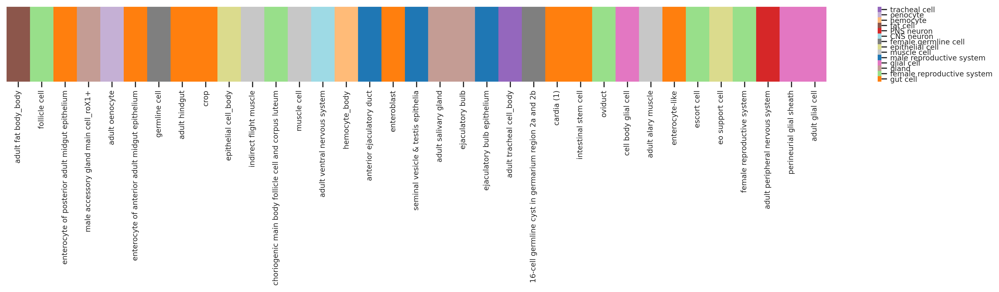

In [83]:
# plt.figure(figsize=(20, 1.5))
fig, ax = plt.subplots(figsize=(20, 1.5))
parameters = {'xtick.labelsize': 8,'ytick.labelsize': 8, 'legend.fontsize':8}
plt.rcParams.update(parameters)

# ax=sns.heatmap(df, cmap='Set3', xticklabels=True)
# ax=sns.heatmap(df, cmap= cmap[:1]+cmap[2:], xticklabels=True, yticklabels=False) # cmap[:8]
ax=sns.heatmap(df, cmap= cmap_L, xticklabels=True, yticklabels=False) # cmap[:8]
plt.tight_layout()

colorbar=ax.collections[0].colorbar
r = colorbar.vmax - colorbar.vmin
colorbar.set_ticks([colorbar.vmin + r / n * (0.5 + i) for i in range(n)])
colorbar.set_ticklabels(value_to_int.keys()) #not in the right order # sorted(list(value_to_int.keys()))

plt.savefig(f'{figure4PicFolder}/{adfcaTissue}_barplot_degN_compareToControl_genotypeCom_sortedByTau_broadCellType.pdf', bbox_inches='tight')
plt.show()

# Fig 4C: DEG# vs. composition

In [84]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

### Relative ratio (normalize to control) & DEG#
Filter cell types with cellN <700

In [87]:
degLong_Df=pd.read_csv(f'{figure3Folder}/degSummary/degLong_Df_genotype_compareToControl_cellN700.csv', index_col=0)
degN_mtx = pd.read_csv(f'{figure3Folder}/degSummary/degN_mtx_genotype_compareToControl_cellN700.csv', index_col=0)
degN_mtx_body=pd.read_csv(f'{degSummaryFolder}/degN_mtx_body_compareToControll_cellN700.csv', index_col=0)

dotplot_Df=pd.read_csv(f'{cellnFolder}/{adfcaTissue}_ratioDf_dotplot_Df_genotypeGroup.csv', index_col=0)

In [88]:
annotation_Df = pd.read_csv(f'/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_annotation_detailed_and_broad_detailed_subcluster.csv')
annotation_Df

,adfca_annotation_broad,adfca_annotation_group,adfca_annotation,adfca_annotation_subcluster,cellN
0,CNS neuron,ABeta42-specific cluster,ABeta42-specific cluster,ABeta42-specific cluster,3765
1,CNS neuron,CNS neuron ungrouped,neuron 1,neuron 1,1118
2,CNS neuron,CNS neuron ungrouped,neuron 10,neuron 10,589
3,CNS neuron,CNS neuron ungrouped,neuron 11,neuron 11,624
4,CNS neuron,CNS neuron ungrouped,neuron 12,neuron 12,417
...,...,...,...,...,...
215,sensory neuron,sensory neuron,scolopidial neuron,scolopidial neuron,659
216,tracheal cell,tracheal cell,adult tracheal cell_body,adult tracheal cell_body,7900
217,tracheal cell,tracheal cell,adult tracheal cell_head,adult tracheal cell_head,6560
218,unannotated,unannotated,antimicrobial peptide-producing cell,antimicrobial peptide-producing cell,507


In [89]:
annot2broad_D = dict(zip(annotation_Df.adfca_annotation, annotation_Df.adfca_annotation_broad))
annot2group_D = dict(zip(annotation_Df.adfca_annotation, annotation_Df.adfca_annotation_group))

In [90]:
broadColor1_Df = pd.read_csv(f'{figure1Folder}/broadColor1_Df.csv', index_col=0)
broadColor1_D = dict(zip(broadColor1_Df.index, broadColor1_Df.colorKey))
broadColor1_D

{'CNS neuron': '#9edae5',
 'PNS neuron': '#d62728',
 'cardial cell': '#17becf',
 'epithelial cell': '#dbdb8d',
 'excretory system': '#ff9896',
 'fat cell': '#8c564b',
 'female germline cell': '#7f7f7f',
 'female reproductive system': '#98df8a',
 'gland': '#c49c94',
 'glial cell': '#e377c2',
 'gut cell': '#ff7f0e',
 'hemocyte': '#ffbb78',
 'male germline cell': '#2ca02c',
 'male reproductive system': '#1f77b4',
 'muscle cell': '#c7c7c7',
 'oenocyte': '#c5b0d5',
 'sensory neuron': '#f7b6d2',
 'tracheal cell': '#9467bd',
 'unannotated': '#bcbd22'}

In [92]:
degN_ratioDf=degN_mtx_body[:]
degN_ratioDf.columns = [ '/'.join(col.split('_')[:-1]) +'_'+ col.split('_')[-1]  for col in degN_ratioDf.columns]
degN_ratioDf.insert(0, 'annotation', degN_ratioDf.index.to_list())

degN_ratioDf.head()

,annotation,AB42/control_inAB42,hTau/control_inTau
adult fat body_body,adult fat body_body,2417,2409
follicle cell,follicle cell,2275,2188
adult oenocyte,adult oenocyte,1114,1123
male accessory gland main cell_roX1+,male accessory gland main cell_roX1+,854,1224
germline cell,germline cell,673,765


In [93]:
dotplot_Df.index = [dotplot_Df.annotation[n]+ '_' + x.split('_ratio')[0] for n, x in enumerate(dotplot_Df.genotypeCompare.to_list())]

dotplot_Df

,annotation,genotypeCompare,log2ratio,cellN
adult fat body_body_AB42/control_inAB42,adult fat body_body,AB42/control_inAB42_ratio,-0.067448,30859.0
adult salivary gland_AB42/control_inAB42,adult salivary gland,AB42/control_inAB42_ratio,0.511884,2032.0
ejaculatory bulb epithelium_AB42/control_inAB42,ejaculatory bulb epithelium,AB42/control_inAB42_ratio,-0.322893,965.0
enterocyte-like_AB42/control_inAB42,enterocyte-like,AB42/control_inAB42_ratio,0.109205,815.0
choriogenic main body follicle cell and corpus luteum_AB42/control_inAB42,choriogenic main body follicle cell and corpus...,AB42/control_inAB42_ratio,-0.704048,1926.0
...,...,...,...,...
female reproductive system_hTau/control_inTau,female reproductive system,hTau/control_inTau_ratio,0.803773,1051.0
muscle cell_hTau/control_inTau,muscle cell,hTau/control_inTau_ratio,0.844912,16863.0
adult peripheral nervous system_hTau/control_inTau,adult peripheral nervous system,hTau/control_inTau_ratio,0.872856,1530.0
epithelial cell_body_hTau/control_inTau,epithelial cell_body,hTau/control_inTau_ratio,0.943125,16651.0


In [94]:
degN_ratio_longDf=degN_ratioDf.melt(id_vars=['annotation'], var_name='genotypeCompare', value_name='degN')
degN_ratio_longDf.index = degN_ratio_longDf.annotation + '_' + degN_ratio_longDf.genotypeCompare

In [95]:
degN_ratio_longDf

,annotation,genotypeCompare,degN
adult fat body_body_AB42/control_inAB42,adult fat body_body,AB42/control_inAB42,2417
follicle cell_AB42/control_inAB42,follicle cell,AB42/control_inAB42,2275
adult oenocyte_AB42/control_inAB42,adult oenocyte,AB42/control_inAB42,1114
male accessory gland main cell_roX1+_AB42/control_inAB42,male accessory gland main cell_roX1+,AB42/control_inAB42,854
germline cell_AB42/control_inAB42,germline cell,AB42/control_inAB42,673
...,...,...,...
escort cell_hTau/control_inTau,escort cell,hTau/control_inTau,71
cell body glial cell_hTau/control_inTau,cell body glial cell,hTau/control_inTau,91
eo support cell_hTau/control_inTau,eo support cell,hTau/control_inTau,49
adult glial cell_hTau/control_inTau,adult glial cell,hTau/control_inTau,12


In [96]:
degN_ratio_longDf=pd.concat([degN_ratio_longDf, dotplot_Df.loc[:,['log2ratio', 'cellN']] ], axis=1)
degN_ratio_longDf

,annotation,genotypeCompare,degN,log2ratio,cellN
adult fat body_body_AB42/control_inAB42,adult fat body_body,AB42/control_inAB42,2417,-0.067448,30859.0
follicle cell_AB42/control_inAB42,follicle cell,AB42/control_inAB42,2275,0.091085,27265.0
adult oenocyte_AB42/control_inAB42,adult oenocyte,AB42/control_inAB42,1114,0.180774,12572.0
male accessory gland main cell_roX1+_AB42/control_inAB42,male accessory gland main cell_roX1+,AB42/control_inAB42,854,-0.257958,3479.0
germline cell_AB42/control_inAB42,germline cell,AB42/control_inAB42,673,-0.311691,5392.0
...,...,...,...,...,...
escort cell_hTau/control_inTau,escort cell,hTau/control_inTau,71,-0.124204,521.0
cell body glial cell_hTau/control_inTau,cell body glial cell,hTau/control_inTau,91,0.118584,902.0
eo support cell_hTau/control_inTau,eo support cell,hTau/control_inTau,49,0.135208,1732.0
adult glial cell_hTau/control_inTau,adult glial cell,hTau/control_inTau,12,0.527517,572.0


In [97]:
degN_ratio_longDf.degN.sort_values(ascending=False)[:20]

adult fat body_body_AB42/control_inAB42                                     2417
adult fat body_body_hTau/control_inTau                                      2409
follicle cell_AB42/control_inAB42                                           2275
follicle cell_hTau/control_inTau                                            2188
enterocyte of posterior adult midgut epithelium_hTau/control_inTau          1730
male accessory gland main cell_roX1+_hTau/control_inTau                     1224
adult oenocyte_hTau/control_inTau                                           1123
adult oenocyte_AB42/control_inAB42                                          1114
enterocyte of anterior adult midgut epithelium_hTau/control_inTau            949
male accessory gland main cell_roX1+_AB42/control_inAB42                     854
germline cell_hTau/control_inTau                                             765
germline cell_AB42/control_inAB42                                            673
adult hindgut_hTau/control_i

In [98]:
degN_ratio_longDf.log2ratio.sort_values(ascending=False)[:10]

perineurial glial sheath_hTau/control_inTau           1.047501
epithelial cell_body_hTau/control_inTau               0.943125
adult peripheral nervous system_hTau/control_inTau    0.872856
muscle cell_hTau/control_inTau                        0.844912
female reproductive system_AB42/control_inAB42        0.816695
female reproductive system_hTau/control_inTau         0.803773
adult alary muscle_hTau/control_inTau                 0.736682
adult hindgut_AB42/control_inAB42                     0.541832
adult glial cell_hTau/control_inTau                   0.527517
adult salivary gland_AB42/control_inAB42              0.511884
Name: log2ratio, dtype: float64

In [99]:
degN_ratio_longDf.log2ratio.sort_values(ascending=True)[:10]

adult fat body_body_hTau/control_inTau                                     -1.868015
adult salivary gland_hTau/control_inTau                                    -1.625962
ejaculatory bulb epithelium_hTau/control_inTau                             -1.546839
enterocyte-like_hTau/control_inTau                                         -1.485448
choriogenic main body follicle cell and corpus luteum_hTau/control_inTau   -1.396086
adult oenocyte_hTau/control_inTau                                          -1.296372
male accessory gland main cell_roX1+_hTau/control_inTau                    -1.055324
enteroblast_hTau/control_inTau                                             -0.947647
ejaculatory bulb_hTau/control_inTau                                        -0.929076
enterocyte of posterior adult midgut epithelium_hTau/control_inTau         -0.917151
Name: log2ratio, dtype: float64

In [100]:
value_to_int={'body':0, 'head': 1}
# value_to_int
n = len(value_to_int)    
# cmap=sns.color_palette("Dark2", 8) # Pastel2
cmap=sns.color_palette("Paired", 9)
cmap

[(0.6509803921568628, 0.807843137254902, 0.8901960784313725),
 (0.12156862745098039, 0.47058823529411764, 0.7058823529411765),
 (0.6980392156862745, 0.8745098039215686, 0.5411764705882353),
 (0.2, 0.6274509803921569, 0.17254901960784313),
 (0.984313725490196, 0.6039215686274509, 0.6),
 (0.8901960784313725, 0.10196078431372549, 0.10980392156862745),
 (0.9921568627450981, 0.7490196078431373, 0.43529411764705883),
 (1.0, 0.4980392156862745, 0.0),
 (0.792156862745098, 0.6980392156862745, 0.8392156862745098)]

In [101]:
highlight_L=['adult fat body_body', 'adult oenocyte', # fat
             'ejaculatory bulb epithelium', 'male accessory gland main cell_roX1+', # male reproduction # 'ejaculatory bulb', 
             'choriogenic main body follicle cell and corpus luteum', # female reproduction
             # 'adult salivary gland', # only one 
              'enteroblast', 'enterocyte of posterior adult midgut epithelium', # gut # 'enterocyte-like', 
            ] # 'follicle cell', 
highlight_num_D = dict(zip(highlight_L, range(1,len(highlight_L)+1)))

In [102]:
highlight_num_D

{'adult fat body_body': 1,
 'adult oenocyte': 2,
 'ejaculatory bulb epithelium': 3,
 'male accessory gland main cell_roX1+': 4,
 'choriogenic main body follicle cell and corpus luteum': 5,
 'enteroblast': 6,
 'enterocyte of posterior adult midgut epithelium': 7}

In [103]:
degN_ratio_longDf['annotation_broad'] = pd.Categorical([annot2broad_D[annot] for annot in degN_ratio_longDf.annotation])

# degN_ratio_longDf['highlight'] = pd.Categorical([x if x in highlight_L else 'others' for x in degN_ratio_longDf.annotation])
degN_ratio_longDf['highlight'] = pd.Categorical([f'{highlight_num_D[x]}.{x}' if x in highlight_L else 'others' for x in degN_ratio_longDf.annotation])
degN_ratio_longDf['highlight_broad'] = pd.Categorical([f'{degN_ratio_longDf.annotation_broad[n]}' if x in highlight_L else 'others' for n, x in enumerate(degN_ratio_longDf.annotation)])

In [104]:
degN_ratio_longDf

,annotation,genotypeCompare,degN,log2ratio,cellN,annotation_broad,highlight,highlight_broad
adult fat body_body_AB42/control_inAB42,adult fat body_body,AB42/control_inAB42,2417,-0.067448,30859.0,fat cell,1.adult fat body_body,fat cell
follicle cell_AB42/control_inAB42,follicle cell,AB42/control_inAB42,2275,0.091085,27265.0,female reproductive system,others,others
adult oenocyte_AB42/control_inAB42,adult oenocyte,AB42/control_inAB42,1114,0.180774,12572.0,oenocyte,2.adult oenocyte,oenocyte
male accessory gland main cell_roX1+_AB42/control_inAB42,male accessory gland main cell_roX1+,AB42/control_inAB42,854,-0.257958,3479.0,gland,4.male accessory gland main cell_roX1+,gland
germline cell_AB42/control_inAB42,germline cell,AB42/control_inAB42,673,-0.311691,5392.0,female germline cell,others,others
...,...,...,...,...,...,...,...,...
escort cell_hTau/control_inTau,escort cell,hTau/control_inTau,71,-0.124204,521.0,female reproductive system,others,others
cell body glial cell_hTau/control_inTau,cell body glial cell,hTau/control_inTau,91,0.118584,902.0,glial cell,others,others
eo support cell_hTau/control_inTau,eo support cell,hTau/control_inTau,49,0.135208,1732.0,epithelial cell,others,others
adult glial cell_hTau/control_inTau,adult glial cell,hTau/control_inTau,12,0.527517,572.0,glial cell,others,others


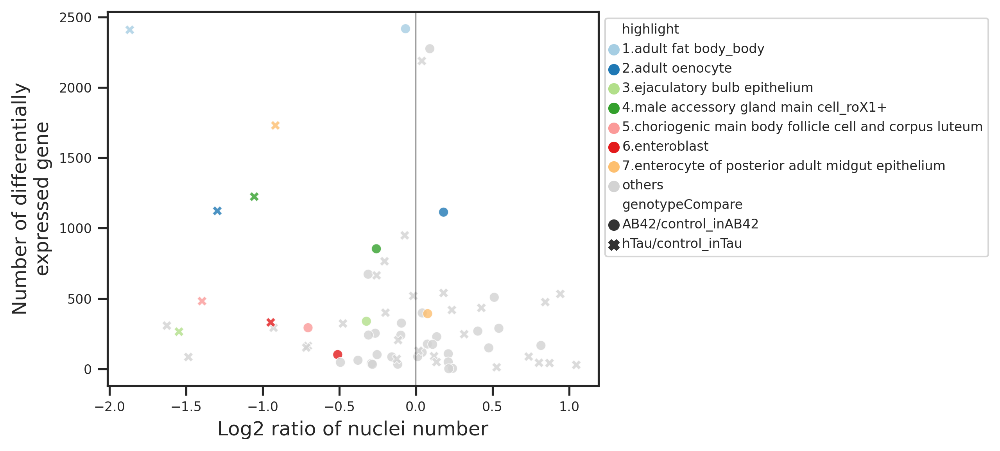

In [110]:
with rc_context({'figure.figsize': (8.5, 4)}):
    # sns.set_style("white")
    g=sns.scatterplot(data=degN_ratio_longDf, # [degN_ratio_longDf_high.annotationH != 'Not selected'] 
                      x="log2ratio", y="degN", hue="highlight", style='genotypeCompare', alpha=0.8, palette=cmap[:8]+ ['lightgrey'], 
                      hue_order=degN_ratio_longDf.highlight.cat.categories.to_list()+['others']) # 'Dark2'
    plt.legend(bbox_to_anchor=(1.00, 1.00))
    # g.set_xticks([-4, -2, 0, 2], minor=False)
    g.grid(axis='both',visible=False)
    
    plt.axvline(0, color='black', linewidth=0.5)
    # plt.axhline(1000, color='firebrick', linewidth=1)
    # plt.axvline(1, color='steelblue', linewidth=1)
    # plt.axvline(-1, color='steelblue', linewidth=1)
    plt.tight_layout()
    # sns.set(font_scale = 0.5)
    # plt.plot('log2ratio', 'deg#', data=degN_ratio_longDf, linestyle='none', marker="o")
    
    plt.xlabel("Log2 ratio of nuclei number")
    plt.ylabel("Number of differentially\nexpressed gene")
    
    plt.savefig(f'{figure4PicFolder}/scatter_degN_cellRatio_normalizeToControl_highlight.pdf', bbox_inches='tight')

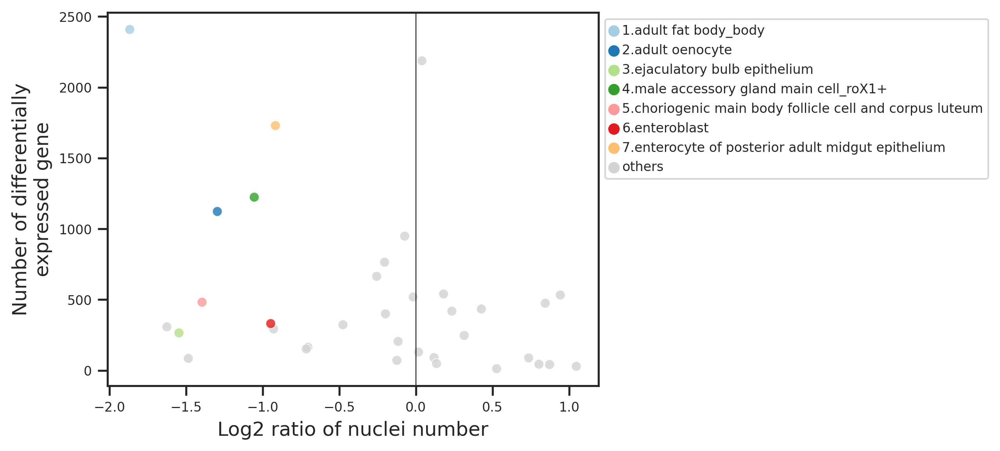

In [111]:
with rc_context({'figure.figsize': (8.5, 4)}):
    # sns.set_style("white")
    g=sns.scatterplot(data=degN_ratio_longDf[degN_ratio_longDf.genotypeCompare == 'hTau/control_inTau'], # [degN_ratio_longDf_high.annotationH != 'Not selected'] 
                       x="log2ratio", y="degN", hue="highlight",  alpha=0.8, palette=cmap[:8]+ ['lightgrey'], 
                      hue_order=degN_ratio_longDf.highlight.cat.categories.to_list()+['others'])
    plt.legend(bbox_to_anchor=(1.00, 1.00))
    # g.set_xticks([-4, -2, 0, 2], minor=False)
    g.grid(axis='both',visible=False)
    
    plt.axvline(0, color='black', linewidth=0.5)
    # plt.axhline(1000, color='firebrick', linewidth=1)
    # plt.axvline(1, color='steelblue', linewidth=1)
    # plt.axvline(-1, color='steelblue', linewidth=1)
    plt.tight_layout()
    # sns.set(font_scale = 0.5)
    # plt.plot('log2ratio', 'deg#', data=degN_ratio_longDf, linestyle='none', marker="o")
    
    plt.xlabel("Log2 ratio of nuclei number")
    plt.ylabel("Number of differentially\nexpressed gene")
    
    plt.savefig(f'{figure4PicFolder}/scatter_degN_cellRatio_normalizeToControl_highlight_TauOnly.pdf', bbox_inches='tight')

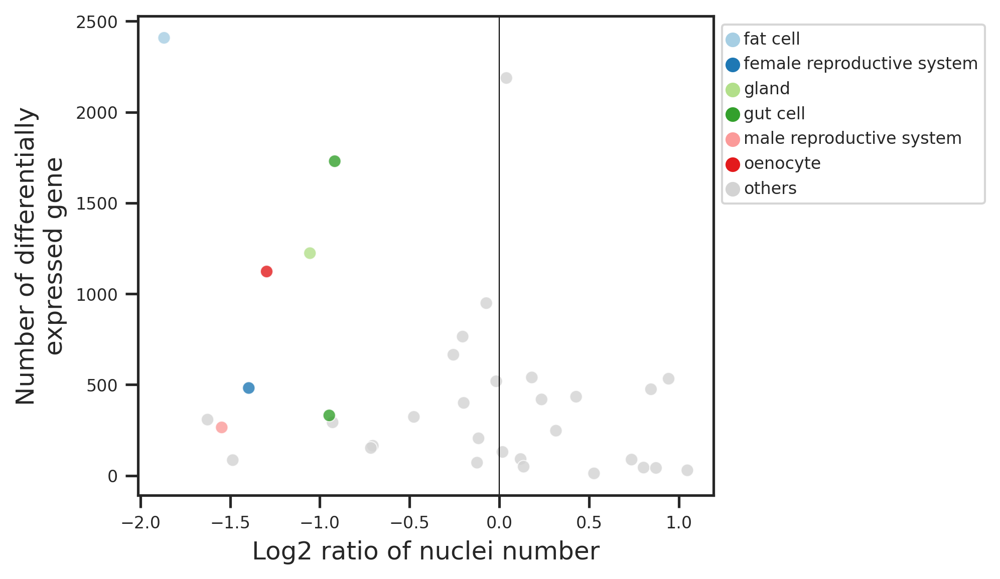

In [123]:
with rc_context({'figure.figsize': (5, 4)}):
    # sns.set_style("white")
    g=sns.scatterplot(data=degN_ratio_longDf[degN_ratio_longDf.genotypeCompare == 'hTau/control_inTau'], # [degN_ratio_longDf_high.annotationH != 'Not selected'] 
                       x="log2ratio", y="degN", hue="highlight_broad",  alpha=0.8, palette=cmap[:6]+ ['lightgrey'], 
                      ) # 'Dark2' # style='genotypeCompare', # hue_order=degN_ratio_longDf.highlight_broad.cat.categories.to_list()+['others']
    # g.set_xticks([-4, -2, 0, 2], minor=False)
    g.grid(axis='both',visible=False)
    
    plt.axvline(0, color='black', linewidth=0.5)
    # plt.axhline(1000, color='firebrick', linewidth=1)
    # plt.axvline(1, color='steelblue', linewidth=1)
    # plt.axvline(-1, color='steelblue', linewidth=1)
    # sns.set(font_scale = 0.5)
    # plt.plot('log2ratio', 'deg#', data=degN_ratio_longDf, linestyle='none', marker="o")
    
    plt.xlabel("Log2 ratio of nuclei number")
    plt.ylabel("Number of differentially\nexpressed gene")
    plt.tight_layout()
    plt.legend(bbox_to_anchor=(1.0, 1.00))
    
    plt.savefig(f'{figure4PicFolder}/scatter_degN_cellRatio_normalizeToControl_highlight_broad_TauOnly.pdf', bbox_inches='tight')

In [124]:
degCompositionSummary=f'{figure4Folder}/degCompositionSummary'
os.makedirs(degCompositionSummary, exist_ok=True)

In [125]:
degN_ratio_longDf

,annotation,genotypeCompare,degN,log2ratio,cellN,annotation_broad,highlight,highlight_broad
adult fat body_body_AB42/control_inAB42,adult fat body_body,AB42/control_inAB42,2417,-0.067448,30859.0,fat cell,1.adult fat body_body,fat cell
follicle cell_AB42/control_inAB42,follicle cell,AB42/control_inAB42,2275,0.091085,27265.0,female reproductive system,others,others
adult oenocyte_AB42/control_inAB42,adult oenocyte,AB42/control_inAB42,1114,0.180774,12572.0,oenocyte,2.adult oenocyte,oenocyte
male accessory gland main cell_roX1+_AB42/control_inAB42,male accessory gland main cell_roX1+,AB42/control_inAB42,854,-0.257958,3479.0,gland,4.male accessory gland main cell_roX1+,gland
germline cell_AB42/control_inAB42,germline cell,AB42/control_inAB42,673,-0.311691,5392.0,female germline cell,others,others
...,...,...,...,...,...,...,...,...
escort cell_hTau/control_inTau,escort cell,hTau/control_inTau,71,-0.124204,521.0,female reproductive system,others,others
cell body glial cell_hTau/control_inTau,cell body glial cell,hTau/control_inTau,91,0.118584,902.0,glial cell,others,others
eo support cell_hTau/control_inTau,eo support cell,hTau/control_inTau,49,0.135208,1732.0,epithelial cell,others,others
adult glial cell_hTau/control_inTau,adult glial cell,hTau/control_inTau,12,0.527517,572.0,glial cell,others,others


In [126]:
degN_ratio_longDf.to_csv(f'{degCompositionSummary}/degN_composition_longDf_body.csv')

# Fig4 Sup: GO analysis

## Load files

In [84]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [127]:
adata_headBody = adata_head.concatenate(adata_body, join='outer')
adata_headBody

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


AnnData object with n_obs × n_vars = 624458 × 16219
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_5.0', 'leiden_6.0', 'leiden_7.0', 'leiden_8.0', 'leiden_9.0', 'leiden_10.0', 'adfca_annotation_group', 'adfca_annotation_subcluster'
    var: 'gene_ids', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'

## Load GO files

### Load ontologies and associations

In [128]:
import goatools

In [129]:
goatools.__version__

'1.3.1'

In [130]:
!pwd

/data/tcl/Project/ADFCA


In [131]:
from goatools.obo_parser import GODag
from goatools.anno.gaf_reader import GafReader

obodag = GODag("../../Resource/GO/go-basic.obo")
ogaf = GafReader("../../Resource/GO/FlyBase_gene_association_09082022.gaf") # FlyBase file

../../Resource/GO/go-basic.obo: fmt(1.2) rel(2022-07-01) 47,008 Terms
HMS:0:00:02.279826 121,359 annotations READ: ../../Resource/GO/FlyBase_gene_association_09082022.gaf 


In [132]:
ns2assc = ogaf.get_ns2assc()

### Load Background gene set

In [133]:
geneid2symbol_Df=pd.read_table('cellrangerSummary/features.tsv', header=None, index_col=0)
geneid2symbol_Df.head()

,1,2
0,,
FBgn0267594,CR45932,Gene Expression
FBgn0259849,Su(Ste):CR42418,Gene Expression
FBgn0085494,Mst77Y-16Psi,Gene Expression
FBgn0085506,CG40635,Gene Expression
FBgn0259870,Su(Ste):CR42439,Gene Expression


In [134]:
geneid2symbol_D= dict(zip(geneid2symbol_Df.index.to_list(), geneid2symbol_Df[1].to_list()))

In [135]:
symbol2geneid_D= dict(zip(geneid2symbol_Df[1].to_list(), geneid2symbol_Df.index.to_list()))

### Initialize a GOEA object 

In [93]:
from goatools.goea.go_enrichment_ns import GOEnrichmentStudyNS

goeaobj = GOEnrichmentStudyNS(
        geneid2symbol_D, # List of fly protein-coding genes
        ns2assc, # geneid/GO associations
        obodag, # Ontologies
        propagate_counts = False,
        alpha = 0.05, # default significance cut-off
        methods = ['fdr_bh']) # defult multipletest correction method


Load BP Ontology Enrichment Analysis ...
 59% 10,305 of 17,562 population items found in association

Load CC Ontology Enrichment Analysis ...
 57%  9,955 of 17,562 population items found in association

Load MF Ontology Enrichment Analysis ...
 53%  9,302 of 17,562 population items found in association


## Load gene list

In [98]:
celltypeN700_L = pd.read_csv(f'{cellnFolder}/celltype_cellN_n700.csv').annotation.to_list()
degLong_Df=pd.read_csv(f'{figure3Folder}/degSummary/degLong_Df_genotype_compareToControl_cellN700.csv', index_col=0)
# degN_nonNeuron_mtx=pd.read_csv(f'{degSummaryFolder}/degN_nonNeuron_mtx_compareToControll_cellN700.csv', index_col=0)
# dotplotNonNeuron_Df=pd.read_csv(f'{compositionFolder}/dotplotNonNeuron_Df_normalizeToControl.csv', index_col=0)
# dfAllNonNeuron = pd.read_csv(f'{compositionFolder}/dfAllNonNeuron_normalizeToControl.csv', index_col=0)

In [141]:
celltypeN700_L_body = adata_body.obs.adfca_annotation.cat.categories.to_list()
len(celltypeN700_L_body)

76

## Plot non-redundant GOs

In [84]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [113]:
adata_headBody = adata_head.concatenate(adata_body, join='outer')
adata_headBody

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


AnnData object with n_obs × n_vars = 624458 × 3285
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad'
    var: 'gene_ids-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'mean-0', 'std-0', 'gene_ids-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'mean-1', 'std-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'

### import revioGO data

In [116]:
from matplotlib.colors import LogNorm, Normalize

In [145]:
allGoConcat_Df=pd.read_csv(f'{figure3Folder}/GO_compareToControl/allGoConcat_Df_compareToControl.csv')
upGoConcat_Df=pd.read_csv(f'{figure3Folder}/GO_compareToControl/upGoConcat_Df_compareToControl.csv')
downGoConcat_Df=pd.read_csv(f'{figure3Folder}/GO_compareToControl/downGoConcat_Df_compareToControl.csv')

In [147]:
revigo_Df = pd.read_table(f'{figure3Folder}/revigo_compareToControl/Revigo_BP_Table_ADFCA.tsv')
revigo_Df[:20]

,TermID,Name,Value,LogSize,Frequency,Uniqueness,Dispensability,Representative
0,GO:0000022,mitotic spindle elongation,-2.441666,1.146128,0.113300,0.908234,0.528503,NaN
1,GO:0051225,spindle assembly,-1.669960,1.806180,0.549067,0.885278,0.744439,22.0
2,GO:0000055,ribosomal large subunit export from nucleus,-1.359202,0.845098,0.052292,0.882807,0.688166,NaN
3,GO:0000165,MAPK cascade,-1.778889,1.544068,0.296322,0.851776,0.535502,NaN
4,GO:0000226,microtubule cytoskeleton organization,-2.055109,2.544068,3.041659,0.893243,0.647770,NaN
5,GO:0007051,spindle organization,-1.498134,2.103804,1.098135,0.892956,0.762188,226.0
6,GO:0000278,mitotic cell cycle,-2.622228,2.594393,3.416420,0.958225,0.035096,NaN
7,GO:0007059,chromosome segregation,-1.306328,2.274158,1.629772,0.959916,0.716547,278.0
8,GO:0000380,"alternative mRNA splicing, via spliceosome",-1.472329,0.698970,0.034861,0.947086,0.346603,NaN
9,GO:0000381,"regulation of alternative mRNA splicing, via s...",-4.946922,1.944483,0.758236,0.886103,0.325096,NaN


In [148]:
nonRedundantGo_Df=revigo_Df[revigo_Df.Representative.isna()]
nonRedundantGo_Df

,TermID,Name,Value,LogSize,Frequency,Uniqueness,Dispensability,Representative
0,GO:0000022,mitotic spindle elongation,-2.441666,1.146128,0.113300,0.908234,0.528503,NaN
2,GO:0000055,ribosomal large subunit export from nucleus,-1.359202,0.845098,0.052292,0.882807,0.688166,NaN
3,GO:0000165,MAPK cascade,-1.778889,1.544068,0.296322,0.851776,0.535502,NaN
4,GO:0000226,microtubule cytoskeleton organization,-2.055109,2.544068,3.041659,0.893243,0.647770,NaN
6,GO:0000278,mitotic cell cycle,-2.622228,2.594393,3.416420,0.958225,0.035096,NaN
...,...,...,...,...,...,...,...,...
1157,GO:2000648,positive regulation of stem cell proliferation,-1.416600,0.954243,0.069723,0.902045,0.651139,NaN
1158,GO:2000683,regulation of cellular response to X-ray,-1.585713,0.698970,0.034861,0.911177,0.310999,NaN
1159,GO:2000738,positive regulation of stem cell differentiation,-2.576015,0.778151,0.043577,0.883649,0.522921,NaN
1161,GO:2000779,regulation of double-strand break repair,-1.402818,1.041393,0.087154,0.882887,0.332103,NaN


In [149]:
revigoNonRedundantGo_L=nonRedundantGo_Df.TermID.to_list()
len(revigoNonRedundantGo_L)

517

In [154]:
goConcatRevigo_Df_exp.annotation.value_counts() 

28

In [153]:
plt.ioff()

color_D = {'up':'Reds', 'down': 'Blues', 'all': 'Purples'}
for degDirection in ['up', 'down', 'all']:
    print(f'degDirection: {degDirection}')
    goConcat_Df = pd.read_csv(f'{figure3Folder}/GO_compareToControl/{degDirection}GoConcat_Df_compareToControl.csv')

    ### GO from revigo ==> don't use in the neuron dataset
    goConcatRevigo_Df=goConcat_Df[goConcat_Df['# GO'].isin(revigoNonRedundantGo_L)]
    goConcatRevigo_Df=goConcat_Df[goConcat_Df.NS == 'BP']
    
    
    # GO from specific genotypes
    # for n, expCompare in enumerate(expCompare_Df.compare2[:]):
    for n, expCompare in enumerate(genoCompare_Df.expSet[:]):
        # expCompare1 = expCompare_Df.compare1[n]
        print(expCompare)
        goConcatRevigo_Df_exp = goConcatRevigo_Df[goConcatRevigo_Df.expCompare == expCompare]
        
        # matrix of GO fdr
        goMtx_exp = pd.DataFrame(columns=celltypeN700_L_body, index=goConcatRevigo_Df_exp.name.value_counts().index.to_list())
        for i, cellType in enumerate(celltypeN700_L_body):
            # print(cellType)
            
            ### run through each GO term
            for j, goName in enumerate(goMtx_exp.index):
                df=goConcatRevigo_Df_exp[(goConcatRevigo_Df_exp.name == goName) & (goConcatRevigo_Df_exp.annotation == cellType)]
                if len(df) != 0:
                    fdr= df.iloc[0,6]
                    goMtx_exp.iloc[j, i]=fdr
                else:
                    goMtx_exp.iloc[j, i]=0
        goMtxTopEach_exp=goMtx_exp[:]
    
    
        ###
        ### top 5 GOs from each cell type
        goN=5
        topGO_eachCelltype_L=[]
        topGO_eachCelltype_D={}
        
        # remove GOs not found in all cell types
        goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)
        # print(goMtxTopEach_exp.shape)
        goMtxTopEach_exp= goMtxTopEach_exp.loc[goMtxTopEach_exp['sumGoCounts'] != 0, :]
        goMtxTopEach_exp.drop('sumGoCounts', axis=1, inplace=True)
        # print(goMtxTopEach_exp.shape)
        
        # select top5 GO from each celltype
        for cellType in goMtxTopEach_exp.columns:
            # print(cellType)    
            
            ### top n GO
            cellType_mtx=pd.DataFrame(goMtxTopEach_exp.loc[:,cellType])
            cellType_mtx.sort_values(by=cellType, ascending=False, inplace=True)
            cellTypeTopGo_L=cellType_mtx.index.to_list()[:goN]
            # print(cellType, cellTypeTopGo_L)
            
            # print(cellTypeTopGo_L)
            if len(cellTypeTopGo_L) != 0:
                for i, go in enumerate(cellTypeTopGo_L):
                    if goMtxTopEach_exp.loc[go, cellType] != 0:
                        topGO_eachCelltype_L.append(go)
                        # print(cellType, go)
                        
                    #     if cellType in topGO_eachCelltype_D.keys(): topGO_eachCelltype_D[cellType].append(go)
                    #     if cellType not in topGO_eachCelltype_D.keys():
                    #         topGO_eachCelltype_D[cellType] = [go]
                    #     if go not in topGO_eachCelltype_L: 
                    #         topGO_eachCelltype_L.append(go)                    
        goMtxTopEach_exp=goMtxTopEach_exp.loc[goMtxTopEach_exp.index.isin(topGO_eachCelltype_L)]
        goMtxTopEach_exp=goMtxTopEach_exp.loc[:, goMtxTopEach_exp.sum(axis=0) != 0]
        goMtxTopEach_exp
        
        # Plot topN GOs
        kws = dict(cbar_kws=dict(orientation='horizontal'))
        ax=sns.clustermap(goMtxTopEach_exp.astype(float),  figsize=(13, 12), xticklabels=True, cmap=color_D[degDirection], dendrogram_ratio=(0.05, 0.1),  **kws, vmax=10, linewidths=0, yticklabels=True)
        ax.ax_cbar.set_position((0.80, .15, .05, .02))
        # ax.cax.set_visible(False)
        plt.savefig(f'{goFolder}/heatmap_GO_{degDirection}_top{goN}Each_{expCompare}.pdf')
        plt.close()
        
        
        # ### Selected cell types
        # goMtxTopEach_exp_select = goMtxTopEach_exp.loc[:,(goMtxTopEach_exp.columns.isin(cellType_L)) ]
        # if sum((goMtxTopEach_exp_select.index.isin(goSelect_L)) | (['endoplasmic reticulum' in index for index in goMtxTopEach_exp_select.index])) > 1:
        #     goMtxTopEach_exp_select = goMtxTopEach_exp_select.loc[ (goMtxTopEach_exp_select.index.isin(goSelect_L)) | (['endoplasmic reticulum' in index for index in goMtxTopEach_exp_select.index]) ]
        #     kws = dict(cbar_kws=dict(orientation='horizontal'))
        #     ax=sns.clustermap(goMtxTopEach_exp_select.astype(float),  figsize=(8.5, 7.5), xticklabels=True, cmap=color_D[degDirection], dendrogram_ratio=(0.05, 0.1),  **kws, vmax=5, linewidths=0, yticklabels=True)
        #     ax.ax_cbar.set_position((0.80, .15, .05, .02))
        #     # ax.cax.set_visible(False)
        #     plt.savefig(f'{goFolder}/heatmap_GO_{degDirection}_top{goN}Each_{expCompare}_selected.pdf')
        #     plt.close()
        
    
    
    print()
plt.ion()

degDirection: up
AB42


/tmp/ipykernel_2227255/515954802.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)


hTau


/tmp/ipykernel_2227255/515954802.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)



degDirection: down
AB42


/tmp/ipykernel_2227255/515954802.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)


hTau


/tmp/ipykernel_2227255/515954802.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)



degDirection: all
AB42


/tmp/ipykernel_2227255/515954802.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)


hTau


/tmp/ipykernel_2227255/515954802.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)


In [154]:
goConcat_Df = pd.read_csv(f'{figure3Folder}/GO_compareToControl/allGoConcat_Df_compareToControl.csv')
goConcat_Df

,# GO,NS,p_fdr_bh,name,annotation,expCompare,MinusLogFdr,goName
0,GO:0002181,BP,7.169472e-106,cytoplasmic translation,16-cell germline cyst in germarium region 2a a...,hTau,105.144513,GO:0002181_cytoplasmic translation
1,GO:0006412,BP,6.067564e-28,translation,16-cell germline cyst in germarium region 2a a...,hTau,27.216986,GO:0006412_translation
2,GO:0000028,BP,4.505353e-05,ribosomal small subunit assembly,16-cell germline cyst in germarium region 2a a...,hTau,4.346271,GO:0000028_ribosomal small subunit assembly
3,GO:0000027,BP,1.534293e-02,ribosomal large subunit assembly,16-cell germline cyst in germarium region 2a a...,hTau,1.814092,GO:0000027_ribosomal large subunit assembly
4,GO:0006414,BP,1.702719e-02,translational elongation,16-cell germline cyst in germarium region 2a a...,hTau,1.768857,GO:0006414_translational elongation
...,...,...,...,...,...,...,...,...
9346,GO:0030594,MF,1.257236e-03,neurotransmitter receptor activity,transmedullary neuron Tm9,AB42,2.900583,GO:0030594_neurotransmitter receptor activity
9347,GO:0022848,MF,1.257236e-03,acetylcholine-gated cation-selective channel a...,transmedullary neuron Tm9,AB42,2.900583,GO:0022848_acetylcholine-gated cation-selectiv...
9348,GO:0005231,MF,1.213845e-02,excitatory extracellular ligand-gated ion chan...,transmedullary neuron Tm9,AB42,1.915837,GO:0005231_excitatory extracellular ligand-gat...
9349,GO:0050839,MF,1.827185e-02,cell adhesion molecule binding,transmedullary neuron Tm9,AB42,1.738217,GO:0050839_cell adhesion molecule binding


In [155]:
adata_headBody.obs.adfca_annotation_broad.value_counts()

CNS neuron                    190758
sensory neuron                 67944
muscle cell                    59410
epithelial cell                49471
female reproductive system     48760
fat cell                       47060
unannotated                    36990
glial cell                     35563
gut cell                       20550
oenocyte                       15605
tracheal cell                  14460
gland                          10162
female germline cell           10151
hemocyte                        9575
male reproductive system        4060
PNS neuron                      2449
excretory system                 918
male germline cell               547
cardial cell                      25
Name: adfca_annotation_broad, dtype: int64

In [161]:
neuronCellType_L = adata_headBody[adata_headBody.obs.adfca_annotation_broad.isin(['CNS neuron', 'sensory neuron', 'PNS neuron'])].obs.adfca_annotation.value_counts().index.to_list()
neuronCellType_L[:10]

['uncharacterized CNS neuron',
 'outer photoreceptor cell',
 'cone cell',
 'adult ventral nervous system',
 'T neuron T4/T5',
 'olfactory receptor neuron',
 'ABeta42-specific cluster',
 'gamma Kenyon cell',
 'alpha/beta Kenyon cell',
 'columnar neuron T1']

In [162]:
goConcat_Df_tau = goConcat_Df[ (goConcat_Df.expCompare == 'hTau') & (goConcat_Df.annotation.isin(neuronCellType_L))]
goConcat_Df_tau

,# GO,NS,p_fdr_bh,name,annotation,expCompare,MinusLogFdr,goName
102,GO:0007268,BP,0.047785,chemical synaptic transmission,T neuron T4/T5,hTau,1.320708,GO:0007268_chemical synaptic transmission
2158,GO:0006302,BP,0.006563,double-strand break repair,adult peripheral nervous system,hTau,2.182867,GO:0006302_double-strand break repair
2159,GO:0007268,BP,0.006563,chemical synaptic transmission,adult peripheral nervous system,hTau,2.182867,GO:0007268_chemical synaptic transmission
2160,GO:1901215,BP,0.007277,negative regulation of neuron death,adult peripheral nervous system,hTau,2.138026,GO:1901215_negative regulation of neuron death
2161,GO:0001508,BP,0.020589,action potential,adult peripheral nervous system,hTau,1.686371,GO:0001508_action potential
...,...,...,...,...,...,...,...,...
9060,GO:0005515,MF,0.005340,protein binding,photoreceptor cell R8,hTau,2.272419,GO:0005515_protein binding
9061,GO:0002046,MF,0.023035,opsin binding,photoreceptor cell R8,hTau,1.637617,GO:0002046_opsin binding
9062,GO:0010461,MF,0.023035,light-activated ion channel activity,photoreceptor cell R8,hTau,1.637617,GO:0010461_light-activated ion channel activity
9304,GO:0007165,BP,0.003350,signal transduction,transmedullary neuron Tm1,hTau,2.475018,GO:0007165_signal transduction


In [170]:
goConcat_Df_tau.goName.value_counts().head(30)

GO:0005886_plasma membrane                                                    13
GO:0007268_chemical synaptic transmission                                      9
GO:0048786_presynaptic active zone                                             9
GO:0045202_synapse                                                             8
GO:0005887_integral component of plasma membrane                               8
GO:0045211_postsynaptic membrane                                               7
GO:0005737_cytoplasm                                                           6
GO:0043005_neuron projection                                                   6
GO:0031594_neuromuscular junction                                              6
GO:0016079_synaptic vesicle exocytosis                                         6
GO:0098609_cell-cell adhesion                                                  5
GO:0030424_axon                                                                5
GO:0005634_nucleus          

In [168]:
goConcat_Df_tau.sort_values(by='MinusLogFdr', ascending=False)[:20]

,# GO,NS,p_fdr_bh,name,annotation,expCompare,MinusLogFdr,goName
8594,GO:0005886,CC,5.738806e-25,plasma membrane,outer photoreceptor cell,hTau,24.241178,GO:0005886_plasma membrane
8595,GO:0005737,CC,3.275780e-20,cytoplasm,outer photoreceptor cell,hTau,19.484685,GO:0005737_cytoplasm
8596,GO:0005634,CC,1.383285e-16,nucleus,outer photoreceptor cell,hTau,15.859088,GO:0005634_nucleus
8597,GO:0016028,CC,3.166539e-16,rhabdomere,outer photoreceptor cell,hTau,15.499415,GO:0016028_rhabdomere
8661,GO:0005515,MF,4.071310e-16,protein binding,outer photoreceptor cell,hTau,15.390266,GO:0005515_protein binding
8598,GO:0031594,CC,9.449653e-16,neuromuscular junction,outer photoreceptor cell,hTau,15.024584,GO:0031594_neuromuscular junction
2721,GO:0005886,CC,7.303742e-15,plasma membrane,adult ventral nervous system,hTau,14.136455,GO:0005886_plasma membrane
3427,GO:0005737,CC,9.467702e-15,cytoplasm,cone cell,hTau,14.023755,GO:0005737_cytoplasm
3428,GO:0005886,CC,1.521841e-12,plasma membrane,cone cell,hTau,11.817631,GO:0005886_plasma membrane
8662,GO:0004674,MF,2.824476e-12,protein serine/threonine kinase activity,outer photoreceptor cell,hTau,11.549062,GO:0004674_protein serine/threonine kinase act...


# Finish

In [75]:
degCount_Df=pd.DataFrame(degLong_Df.names.value_counts())
degCount_Df['geneName'] = degCount_Df.index.to_list()
degCount_Df

,names,geneName
pre-rRNA:CR45845,223,pre-rRNA:CR45845
lncRNA:roX2,215,lncRNA:roX2
lncRNA:CR34335,214,lncRNA:CR34335
lncRNA:roX1,212,lncRNA:roX1
Hsp83,191,Hsp83
...,...,...
CG14182,1,CG14182
GCC88,1,GCC88
Fmo-1,1,Fmo-1
CG17059,1,CG17059


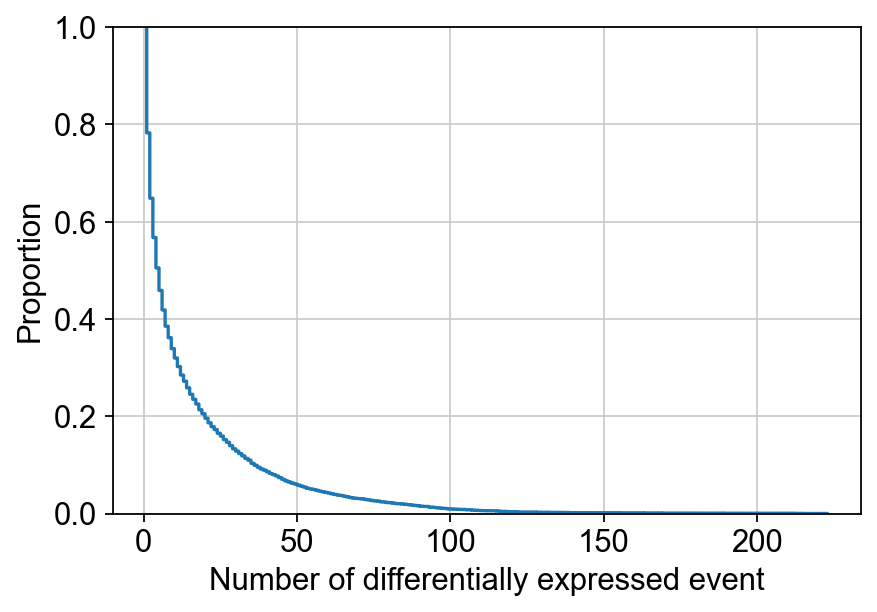

In [83]:
with rc_context({'figure.figsize': (6, 4)}):
    sns.ecdfplot(data=degCount_Df, x="names", complementary=True)
    plt.xlabel('Number of differentially expressed event')

In [85]:
gene_annotN_Df = degLong_Df.groupby(by=['names', 'annotation']).count()

In [101]:
gene_annotN_Df

pvals  adj  \
names         annotation                                                       
128up         adult fat body_body                                     1    1   
              follicle cell                                           1    1   
14-3-3epsilon 16-cell germline cyst in germarium region 2a an...      1    1   
              adult brain perineurial glial cell                      1    1   
              adult differentiating enterocyte                        1    1   
...                                                                 ...  ...   
zyd           adult fat body_body                                     1    1   
              cell body glial cell                                    1    1   
              ensheathing glial cell                                  1    1   
              pericerebral adult fat mass                             1    1   
              skeletal muscle of head                                 1    1   

                                                                  logfoldchanges  \
names         annotation                                                           
128up         adult fat body_body                                              1   
              follicle cell                                                    1   
14-3-3epsilon 16-cell germline cyst in germarium region 2a an...               1   
              adult brain perineurial glial cell                               1   
              adult differentiating enterocyte                                 1   
...                                                                          ...   
zyd           adult fat body_body                                              1   
              cell body glial cell                                             1   
              ensheathing glial cell                                           1   
              pericerebral adult fat mass                                      1   
              skeletal muscle of head                                          1   

                                                                  age  
names         annotation                                               
128up         adult fat body_body                                   1  
              follicle cell                                         1  
14-3-3epsilon 16-cell germline cyst in germarium region 2a an...    1  
              adult brain perineurial glial cell                    1  
              adult differentiating enterocyte                      1  
...                                                               ...  
zyd           adult fat body_body                                   1  
              cell body glial cell                                  1  
              ensheathing glial cell                                1  
              pericerebral adult fat mass                           1  
              skeletal muscle of head                               1  

[66466 rows x 4 columns]

In [107]:
celltypeCount_Df=pd.DataFrame(index=degCount_Df.index.to_list(), columns=['geneName', 'cellTypeN'])
for i, gene in enumerate(degCount_Df.index):
    # print(gene)
    # print(len(gene_annotN_Df.loc[gene]))
    
    cellTypeN=len(gene_annotN_Df.loc[gene])
    celltypeCount_Df.loc[gene] = [gene, cellTypeN]

celltypeCount_Df.sort_values(by='cellTypeN', inplace=True, ascending=False)
celltypeCount_Df

,geneName,cellTypeN
Hsp83,Hsp83,112
lncRNA:CR34335,lncRNA:CR34335,110
lncRNA:Hsromega,lncRNA:Hsromega,109
mt:lrRNA,mt:lrRNA,109
Pka-C3,Pka-C3,108
...,...,...
CG11112,CG11112,1
asRNA:CR45468,asRNA:CR45468,1
lncRNA:CR43632,lncRNA:CR43632,1
CG43125,CG43125,1


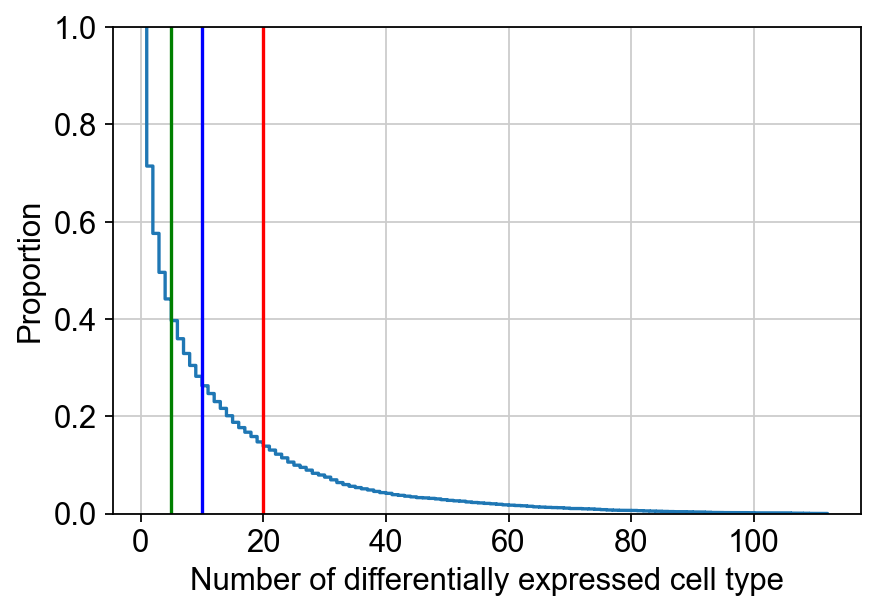

In [116]:
with rc_context({'figure.figsize': (6, 4)}):
    sns.ecdfplot(data=celltypeCount_Df, x="cellTypeN", complementary=True)
    plt.xlabel('Number of differentially expressed cell type')
    plt.axvline(5, color='green') # color=['green', 'blue', 'red']
    plt.axvline(10, color='blue')
    plt.axvline(20, color='red')

In [67]:
for i in range(10):
    sc.pl.violin(adata_headBody, keys=degCount_Df.index.to_list()[i*5:(i+1)*5], groupby='age', size=0, save=f'_highDE_group{i}.png', show=False)

In [70]:
rp_L=['RpLP1', 'RpL27A', 'RpLP2', 'RpL7A', 'RpS8']

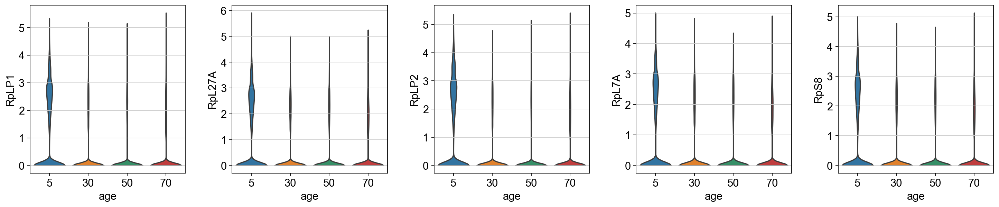

In [71]:
sc.pl.violin(adata_headBody, keys=rp_L, groupby='age', size=0, save=f'_highDE_RpGene.png')

In [60]:
gene_L=['unc-13', 'l(3)80Fg', 'lola', 'CG17684', 'Snap25', 'Myo81F', 'Myo81F', 'shot', 'CG4467', 'l(3)80Fj']

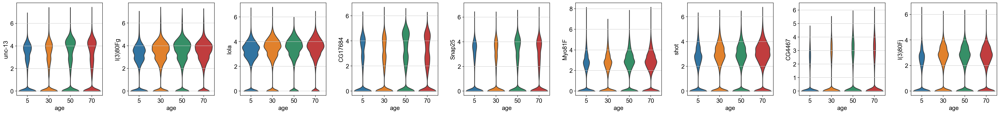

In [72]:
sc.pl.violin(adata_headBody, keys=gene_L, groupby='age', size=0, save=f'_highDE_upGenes.png')

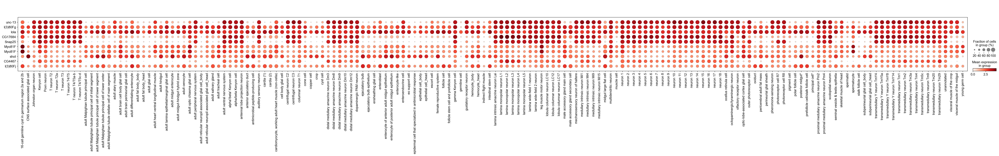

In [61]:
sc.pl.dotplot(adata_headBody, var_names=gene_L, groupby='afca_annotation', swap_axes=True)

In [68]:
for cellType in celltypeN500_L:
    print(cellType)
    cellTypeName='_'.join(cellType.split('/'))
    sc.pl.violin(adata_headBody[adata_headBody.obs.afca_annotation == cellType], keys=gene_L, groupby='age', size=0, save=f'_commonAgingMarker_{cellTypeName}.png', show=False)

16-cell germline cyst in germarium region 2a and 2b


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Johnston organ neuron


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Poxn neuron


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


T neuron T2


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


T neuron T2a


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


T neuron T3


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


T neuron T4/T5


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


T neuron T4/T5a-b


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


T neuron T4/T5c-d


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult alary muscle


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult brain cell body glial cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult brain perineurial glial cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult differentiating enterocyte


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult fat body_body


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult fat body_head


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult glial cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult hindgut


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult lamina epithelial/marginal glial cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult midgut-hindgut hybrid zone


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult oenocyte


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult optic chiasma glial cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult peripheral nervous system


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult reticular neuropil associated glial cell_body


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult reticular neuropil associated glial cell_head


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult salivary gland


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult tracheal cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


adult ventral nervous system


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


alpha'/beta' Kenyon cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


alpha/beta Kenyon cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


auditory sensory neuron


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


cardia (1)


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


cell body glial cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


centrifugal neuron C2


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


centrifugal neuron C3


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


columnar neuron T1


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


cone cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


crop


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


distal medullary amacrine neuron Dm10


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


distal medullary amacrine neuron Dm3


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


distal medullary amacrine neuron Dm8


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


distal medullary amacrine neuron Dm9


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


ejaculatory bulb


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


ejaculatory bulb epithelium


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


ensheathing glial cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


enteroblast


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


enterocyte of posterior adult midgut epithelium


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


enteroendocrine cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


eo support cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


epithelial cell_body


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


epithelial cell_head


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


escort cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


female reproductive system


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


follicle cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


gamma Kenyon cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


germline cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


gustatory receptor neuron


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


hemocyte_body


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


hemocyte_head


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


indirect flight muscle


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


intestinal stem cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


lamina intrinsic amacrine neuron Lai


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


lamina monopolar neuron L1


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


lamina monopolar neuron L2


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


lamina monopolar neuron L3


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


lamina monopolar neuron L4


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


lamina monopolar neuron L5


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


lamina wide-field 1 neuron


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


lamina wide-field 2 neuron


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


lobula columnar neuron LC10


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


lobula columnar neuron LC17


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


male accessory gland main cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


mechanosensory neuron of haltere


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


medullary intrinsic neuron Mi1


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


medullary intrinsic neuron Mi15


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


medullary intrinsic neuron Mi4


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


medullary intrinsic neuron Mi9


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


muscle cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


neuron 1


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


neuron 10


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


neuron 2


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


neuron 3


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


neuron 4


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


neuron 5


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


neuron 6


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


neuron 7


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


neuron 8


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


neuron 9


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


olfactory receptor neuron


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


optic-lobe-associated cortex glial cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


outer photoreceptor cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


oviduct


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


pericerebral adult fat mass


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


perineurial glial sheath


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


pheromone-sensing neuron


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


photoreceptor cell R7


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


photoreceptor cell R8


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


pigment cell


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


scolopidial neuron


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


seminal vesicle & testis epithelia


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


skeletal muscle of head


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


subperineurial glial cell_body


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


subperineurial glial cell_head


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


transmedullary Y neuron TmY14


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


transmedullary Y neuron TmY4


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


transmedullary Y neuron TmY5a


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


transmedullary Y neuron TmY8


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


transmedullary neuron Tm1


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


transmedullary neuron Tm2


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


transmedullary neuron Tm20


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


transmedullary neuron Tm3a


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


transmedullary neuron Tm4


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


transmedullary neuron Tm9


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


visceral muscle of the crop


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


visceral muscle of the midgut


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [73]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{highDeFolder}/{x}')